```python
a = np.arange(1, 4, 2)
b = np.arange(4, 7, 2)
for (i, j) in [(i, j) for i in a for j in b]:
    print i, j
    
    
# Delete columns with value '(X)'
count = 0
for col in data.columns:
    if '(X)' in data[col].unique():
        print col
        data.pop(col)
        count += 1
print count
```

In [1]:
# Plotting
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
pd.set_option('display.max_columns', 100) # Set Number of Columns to view

import numpy as np

# String manipulation
import string 

# For viewing files in a specified directory
import glob

import itertools as it

# Statsmodels: ! easy_install statsmodels
import statsmodels.api as sm

# High performance container datatypes
from collections import Counter

In [2]:
# Load data
data = pd.read_csv('new_final_merged_data.csv')
data.head(3)

,County,Jurisdiction,Num_RecyclingProg_2007,Target_ResPPD_2007,Annual_ResPPD_2007,Target_EmpPPD_2007,Annual_EmpPPD_2007,Num_RecyclingProg_2008,Target_ResPPD_2008,Annual_ResPPD_2008,Target_EmpPPD_2008,Annual_EmpPPD_2008,Num_RecyclingProg_2009,Target_ResPPD_2009,Annual_ResPPD_2009,Target_EmpPPD_2009,Annual_EmpPPD_2009,Num_RecyclingProg_2010,Target_ResPPD_2010,Annual_ResPPD_2010,Target_EmpPPD_2010,Annual_EmpPPD_2010,Num_RecyclingProg_2011,Target_ResPPD_2011,Annual_ResPPD_2011,Target_EmpPPD_2011,Annual_EmpPPD_2011,Num_RecyclingProg_2012,Target_ResPPD_2012,Annual_ResPPD_2012,Target_EmpPPD_2012,Annual_EmpPPD_2012,Num_RecyclingProg_2013,Target_ResPPD_2013,Annual_ResPPD_2013,Target_EmpPPD_2013,Annual_EmpPPD_2013,Population,Male,Female,MedianAgeYears,MaleMedianAgeYears,FemaleMedianAgeYears,AverageHouseholdSize,AverageFamilySize,PersonsUnder5Years,PersonsUnder18Years,PersonsAge21Plus,PersonsAge55Plus,PersonsAge60Plus,...,Homicide_2010,Rape_2010,Robbery_2010,Assault_2010,Property_2010,Burglary_2010,VehicleTheft_2010,Larceny_2010,Arson_2010,TotCrimes_2010,Violent_2011,Homicide_2011,Rape_2011,Robbery_2011,Assault_2011,Property_2011,Burglary_2011,VehicleTheft_2011,Larceny_2011,Arson_2011,TotCrimes_2011,Violent_2012,Homicide_2012,Rape_2012,Robbery_2012,Assault_2012,Property_2012,Burglary_2012,VehicleTheft_2012,Larceny_2012,Arson_2012,TotCrimes_2012,Violent_2013,Homicide_2013,Rape_2013,Robbery_2013,Assault_2013,Property_2013,Burglary_2013,VehicleTheft_2013,Larceny_2013,Arson_2013,TotCrimes_2013,SolarUnitCount,Pop_2010,Area_SqMi,SolarUnits_Residential,SolarUnits_Government,SolarUnits_Commercial,SolarUnits_Nonprofit
0,San Bernardino,Adelanto,35,6.9,4.8,40.6,31.7,35,6.9,3.8,40.6,25.3,42,6.9,3.2,40.6,24.6,44,6.9,2.8,40.6,28.1,45,6.9,3.0,40.6,28.7,45,6.9,3.0,40.6,27.2,45,6.9,3.2,40.6,22.0,31765,16318,15447,25.3,25.0,25.7,3.843258,4.11,3280,11807,18097,3367,2243,...,4,9,39,190,726,359,94,273,13,3959,164,1,18,34,111,885,410,112,363,15,4124,199,1,18,45,135,924,397,147,380,15,4273,198,2,15,52,129,886,381,133,372,17,4198,60,31765,56.01,53,2,5,0
1,Los Angeles,Agoura Hills,30,7.0,6.6,15.2,13.1,32,7.0,5.7,15.2,10.9,32,7.0,5.0,15.2,10.0,32,7.0,5.8,15.2,11.5,32,7.0,5.7,15.2,10.8,33,7.0,5.8,15.2,10.4,33,7.0,5.5,15.2,9.9,20330,10021,10309,42.4,41.2,43.4,2.762659,3.15,896,4904,14670,5527,3707,...,0,2,1,15,240,59,8,173,0,2526,15,0,1,3,11,255,74,13,168,1,2552,12,0,2,1,9,236,62,16,158,1,2509,19,0,2,10,7,306,109,12,185,7,2670,399,20330,7.79,388,2,6,2
2,Alameda,Alameda,45,5.5,3.8,21.4,13.8,45,5.5,3.6,21.4,12.4,45,5.5,3.2,21.4,11.6,45,5.5,2.8,21.4,10.2,45,5.5,3.0,21.4,10.1,45,5.5,2.7,21.4,8.9,45,5.5,2.6,21.4,8.2,73812,35315,38497,40.7,39.5,41.9,2.400691,3.06,4182,15304,56295,20125,14672,...,1,15,74,83,1964,389,215,1360,10,6294,207,1,15,94,97,1898,315,260,1323,15,6236,160,1,9,80,70,1892,296,295,1301,18,6134,158,0,10,85,63,1902,287,330,1285,17,6150,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
del data['SolarUnitCount']
del data['Pop_2010']

# Delete data columns from 2007 to 2012
years = list(np.arange(2007, 2013, 1))

# Function to delete columns
def del_cols(df, year):
    #del df['Num_RecyclingProg_' + str(year)]
    del df['Target_ResPPD_' + str(year)]
    del df['Annual_ResPPD_' + str(year)]
    del df['Target_EmpPPD_' + str(year)]
    del df['Annual_EmpPPD_' + str(year)]
    del df['Violent_' + str(year)]
    del df['Homicide_' + str(year)]
    del df['Rape_' + str(year)]
    del df['Robbery_' + str(year)]
    del df['Assault_' + str(year)]
    del df['Property_' + str(year)]
    del df['Burglary_' + str(year)]
    del df['VehicleTheft_' + str(year)]
    del df['Larceny_' + str(year)]
    del df['Arson_' + str(year)]
    del df['TotCrimes_' + str(year)]
    del df['Total_' + str(year)]
    del df['MultiFamily(2)_' + str(year)]
    del df['MultiFamily(3to4)_' + str(year)]
    del df['MultiFamily(5)_' + str(year)]
    del df['MultiFamily(all)_' + str(year)]
    del df['SingleFamily_' + str(year)]
    del df['Tot_Registered_' + str(year)]
    del df['Democratic_' + str(year)]
    del df['Republican_' + str(year)]
    del df['American_Independent_' + str(year)]
    del df['Green_' + str(year)]
    del df['Libertarian_' + str(year)]
    del df['Peace_Freedom_' + str(year)]
    del df['Other_' + str(year)]
    del df['No_Preference_' + str(year)]
    del df['Num_RecyclingProg_' + str(year)]



# Iterate and delete
for i in years:
    del_cols(data, i)
    
# Delete Program columns from 2007 to 2012   
pgm = list(np.arange(1, 63, 1))

def del_col_prgm(df, year, program):
    del df[str(year) + '_Prgm_' + str(program)]

for i in years:
    for j in pgm:
        del_col_prgm(data, i, j)

def del_count(df, year):
    del df['Count_' + str(year)]

for i in years:
    del_count(data, i)
    
print '# Rows: {}, and # Columns, {}'.format(data.shape[0], data.shape[1])

# Rows: 378, and # Columns, 380


**EDA Plots: Some Ideas**

- Histograms: PPD Rate
- PPD Rate Vs Residential Solar Units/Household 
- PPD Rate Vs Government Solar Units/Population
- PPD Rate Vs Total Crime/Population
- PPD Rate Vs Population/Area

## Histograms

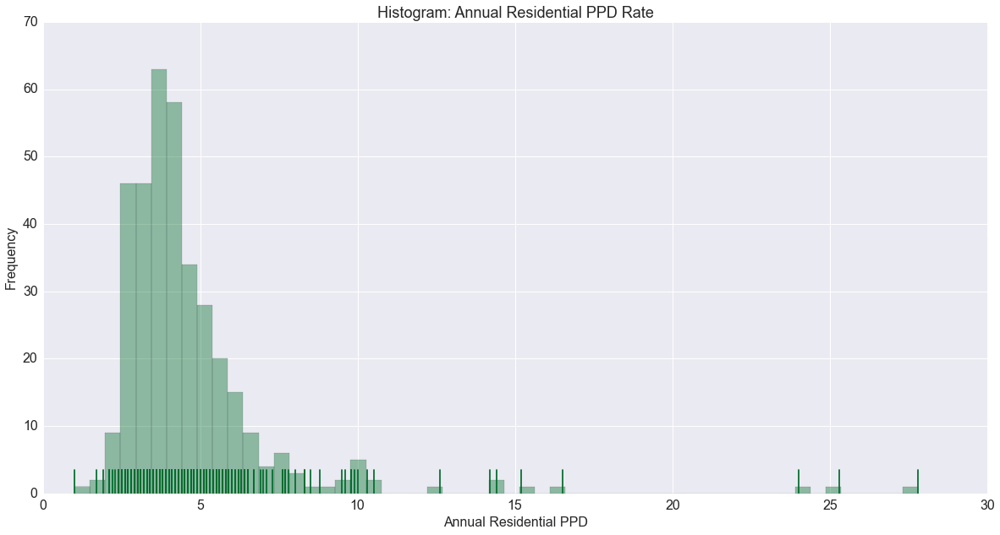

In [4]:
# Histogram: Annual Residential PPD Rate
temp_res = data[data['Annual_ResPPD_2013'] < 100] # Dropped outliers

plt.figure(figsize = (20, 10))
sns.distplot(temp_res['Annual_ResPPD_2013'].dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Annual Residential PPD', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Annual Residential PPD Rate', fontsize = 18)

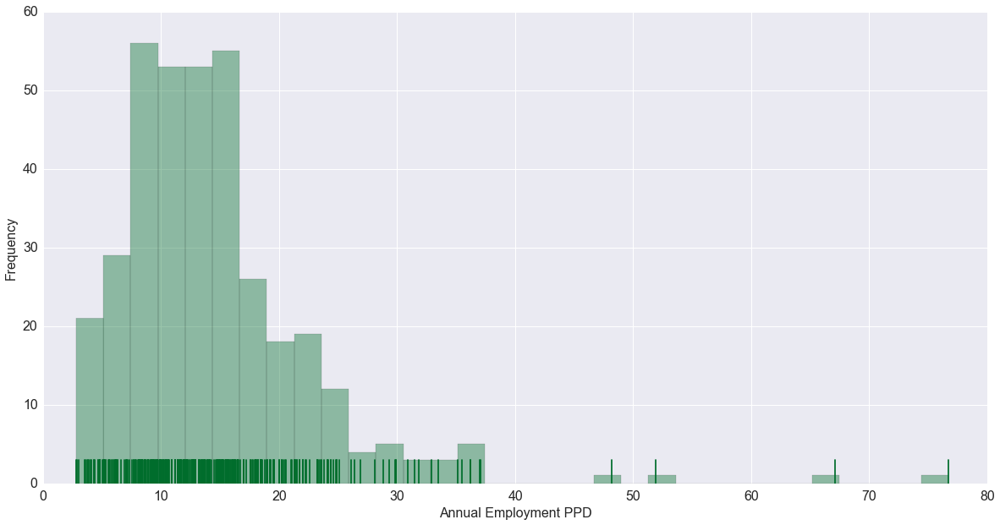

In [5]:
# Histogram: Annual Employment PPD Rate
temp_emp = data[data['Annual_EmpPPD_2013'] < 100] # Dropped outliers

plt.figure(figsize = (20, 10))
sns.distplot(temp_emp['Annual_EmpPPD_2013'].dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Annual Employment PPD', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)

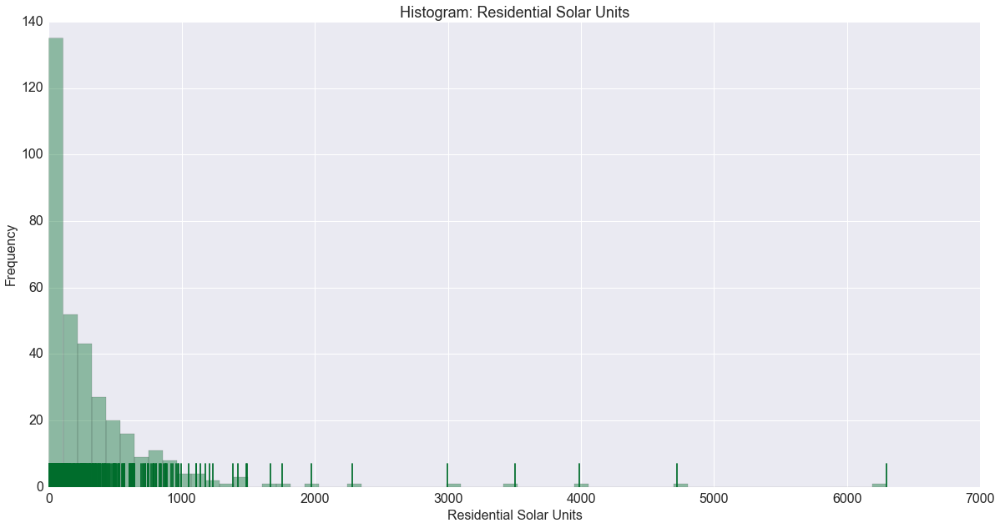

In [6]:
# Histogram: Residential Solar Units
temp = data['SolarUnits_Residential']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Residential Solar Units', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Residential Solar Units', fontsize = 18)

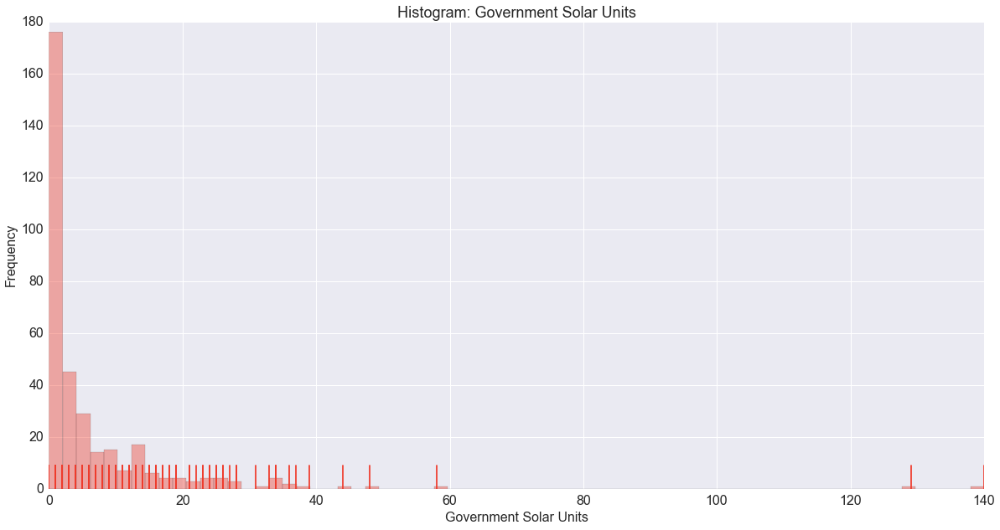

In [7]:
# Histogram: Government Solar Units
temp = data['SolarUnits_Government']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#ef3b2c')
plt.xlabel('Government Solar Units', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Government Solar Units', fontsize = 18)

# Interesting: Majority have 0, some have 1 or more, check rates

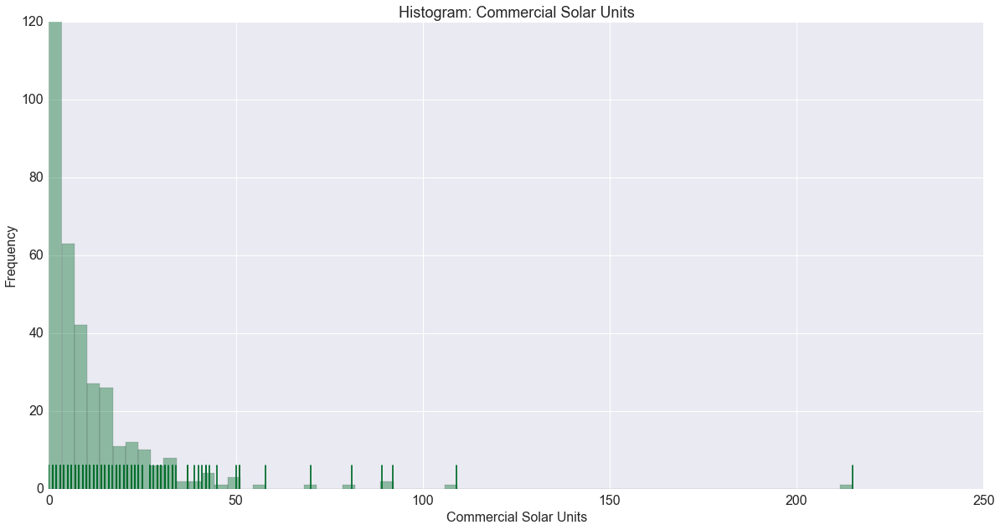

In [8]:
# Histogram: Commercial Solar Units
temp = data['SolarUnits_Commercial']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Commercial Solar Units', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Commercial Solar Units', fontsize = 18)

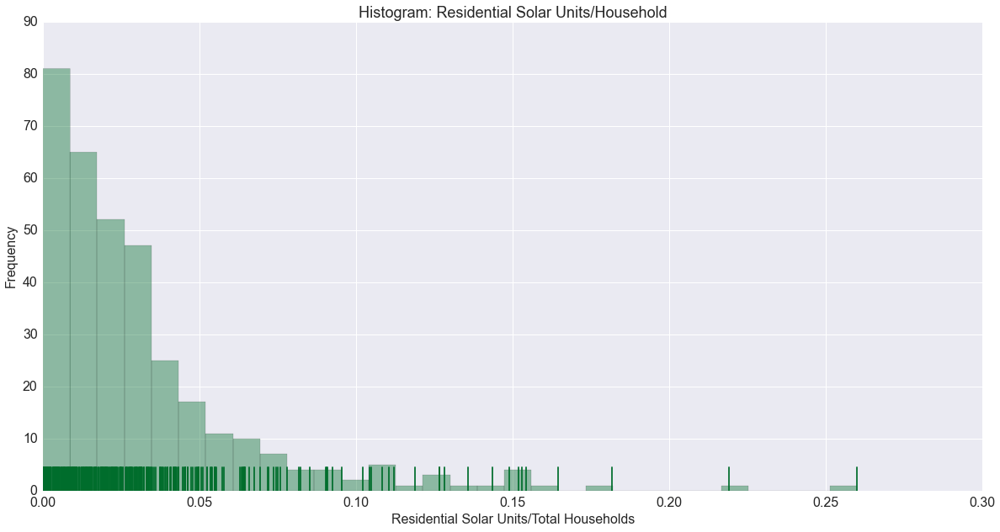

In [9]:
# Histogram: Residential Solar Units/Household
temp = data['SolarUnits_Residential']/data['TotalHH']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Residential Solar Units/Total Households', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Residential Solar Units/Household', fontsize = 18)

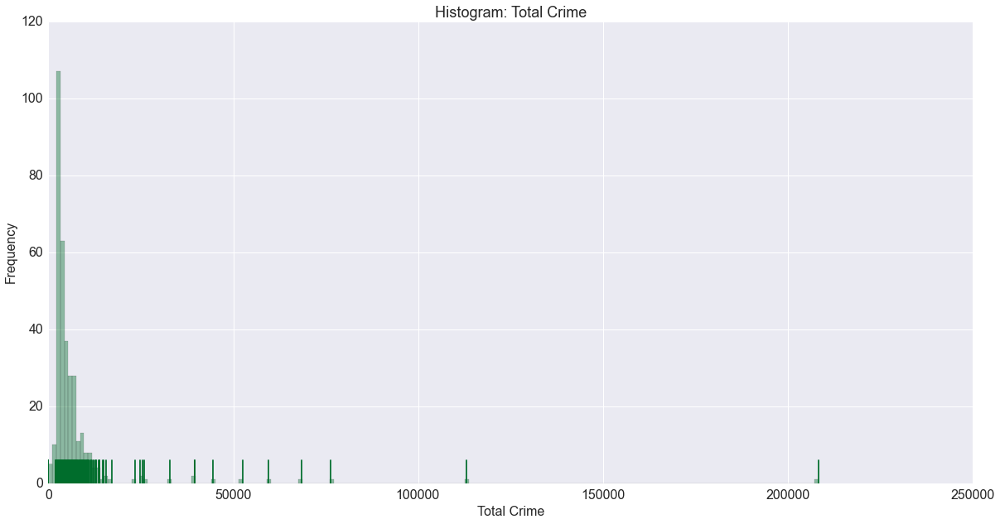

In [10]:
# Histogram: Total Crime
temp = data['TotCrimes_2013']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Total Crime', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Total Crime', fontsize = 18)

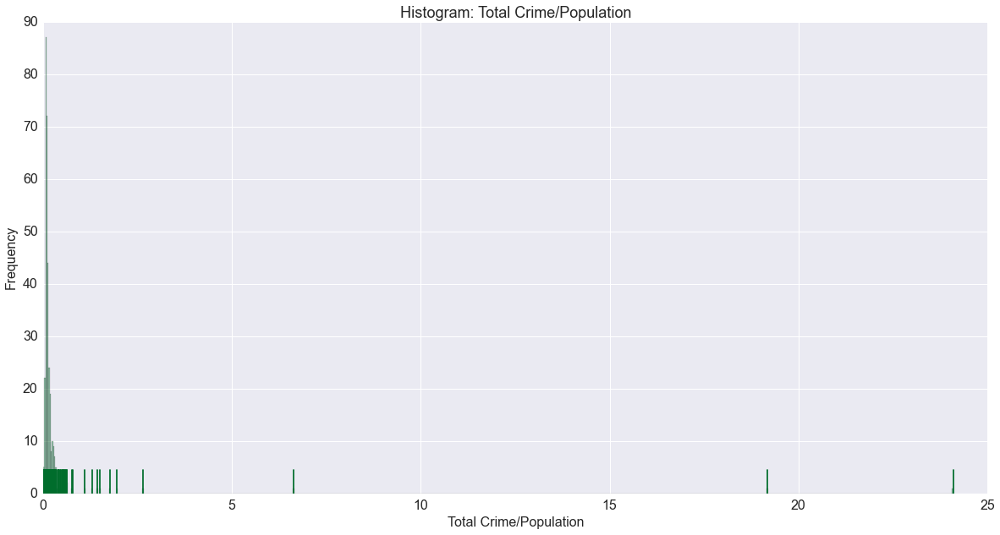

In [11]:
# Histogram: Total Crime/Population
temp = data['TotCrimes_2013']/data['Population']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Total Crime/Population', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Total Crime/Population', fontsize = 18)

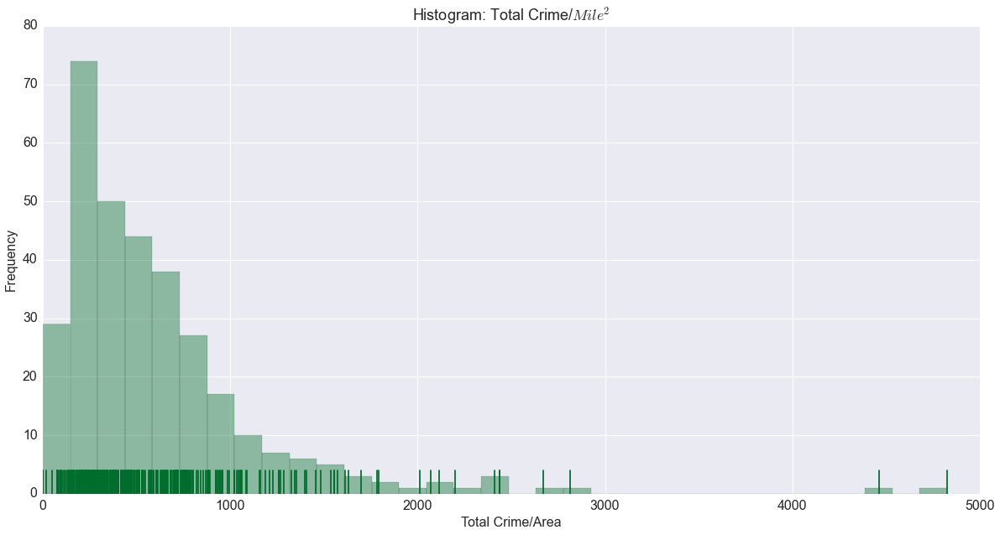

In [12]:
# Histogram: Crime Density = Total Crime/Area
temp = data['TotCrimes_2013']/data['Area_SqMi']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Total Crime/Area', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Total Crime/$Mile^2$', fontsize = 18)

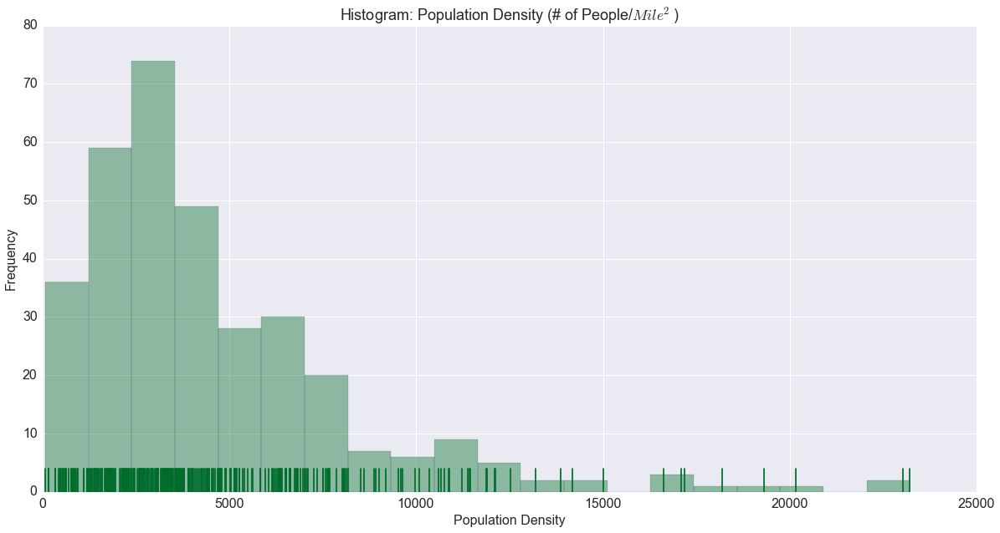

In [13]:
# Histogram: Population Density = Population/Area
temp = data['Population']/data['Area_SqMi']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#006d2c')
plt.xlabel('Population Density', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Population Density (# of People/$Mile^2$)', fontsize = 18)

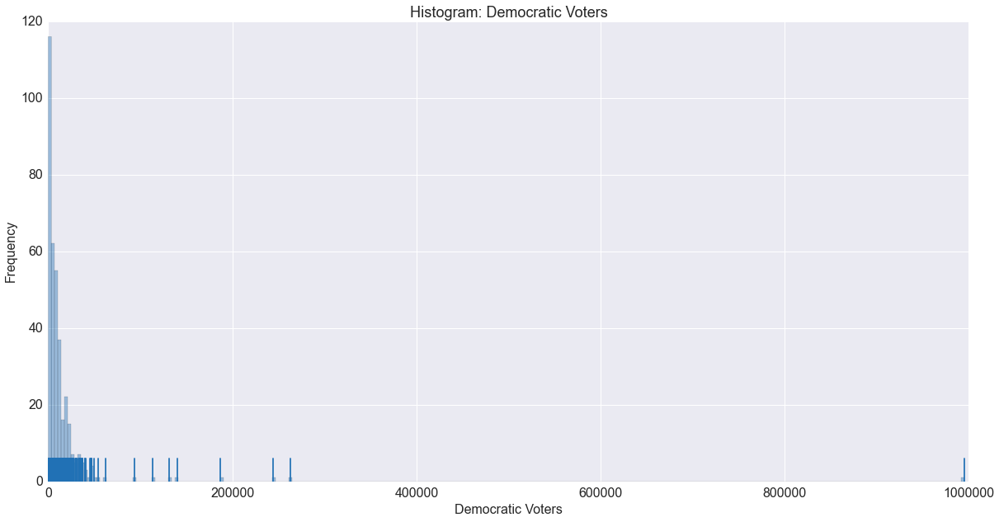

In [14]:
# Histogram: Democratic Voters
temp = data['Democratic_2013']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#2171b5')
plt.xlabel('Democratic Voters', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Democratic Voters', fontsize = 18)

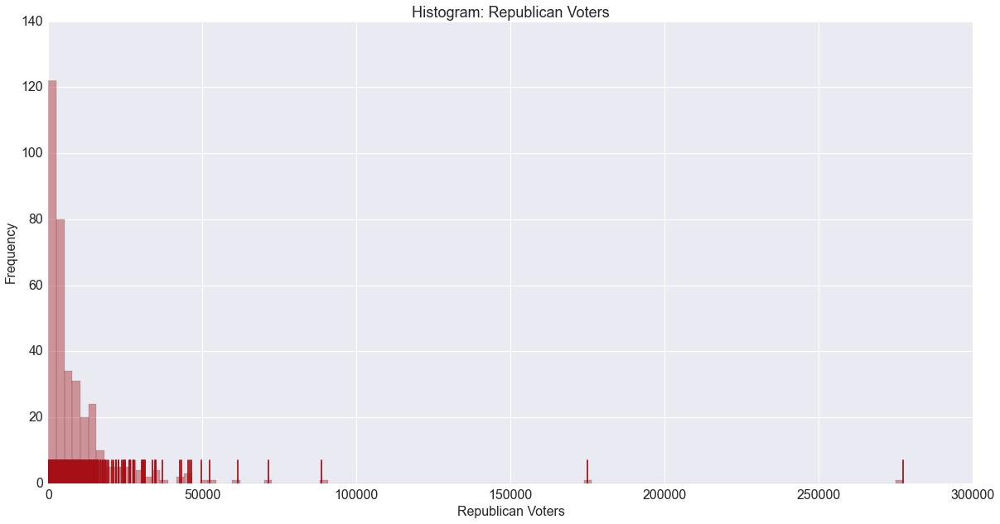

In [15]:
# Histogram: Republican Voters
temp = data['Republican_2013']

plt.figure(figsize = (20, 10))
sns.distplot(temp.dropna(), kde = False, rug = True, color = '#a50f15')
plt.xlabel('Republican Voters', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Republican Voters', fontsize = 18)

In [16]:
def ppd_vs_voter_program(df, ppd, party):
    '''
    Function to plot PPD rate vs % Registered to a Political Party, given recycling program
    df: Dataframe
    ppd (String input): Annual_ResPPD_ or Annual_EmpPPD_
    party (String input): Democratic_ or Republican_ or Green_ or ...otherParty_
    '''
    key = pd.read_csv('program_key.csv')
    i = str(2013)
    prgm = list(np.arange(1, 63, 1))
    for p in prgm:
        temp = df[[ppd + i, party + i, 'Tot_Registered_' + i, i + '_Prgm_' + str(p)]]
        # Remove PPD outlier
        temp = temp[temp[ppd + i] < 100]
        # Calculate Voter %
        temp[party[:-1]] = temp[party + i] * 100/temp['Tot_Registered_' + i]
        plt.figure(figsize=(20,10))
        # If Program = 1 - Green, else - Red
        cond = temp[i + '_Prgm_' + str(p)] == 1
        plt.scatter(temp[ppd + i][cond], temp[party[:-1]][cond], color = '#006d2c', alpha = 0.5, label = 'Implemented')
        plt.scatter(temp[ppd + i][~cond], temp[party[:-1]][~cond], color = '#a50f15', alpha = 0.5, label = 'Not Implemented')
        # Figure text
        text_0 = ppd[:-8] + ' ' + ppd[-7:-4] + ' ' + ppd[-4:-1]
        text_1 = ' Vs % ' + party[:-1]
        text_2 = ' for Program:' + key[key['Key'] == 'Prgm_' + str(p)]['Program Name'][p-1]
        # Set axis labels
        plt.xlabel(text_0, fontsize = 16)
        plt.ylabel('% ' + party[:-1], fontsize = 16)
        # Set axis limits
        plt.xlim(0, max(temp[ppd + i]))
        #plt.xlim(0, 150)
        plt.ylim(0, 100)
        # Set tick label size
        plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
        # Set figure title
        plt.title(text_0 + text_1 + text_2, fontsize = 16)
        # Set legend and legends fontsize
        plt.legend(prop={'size': 14})
        plt.show()

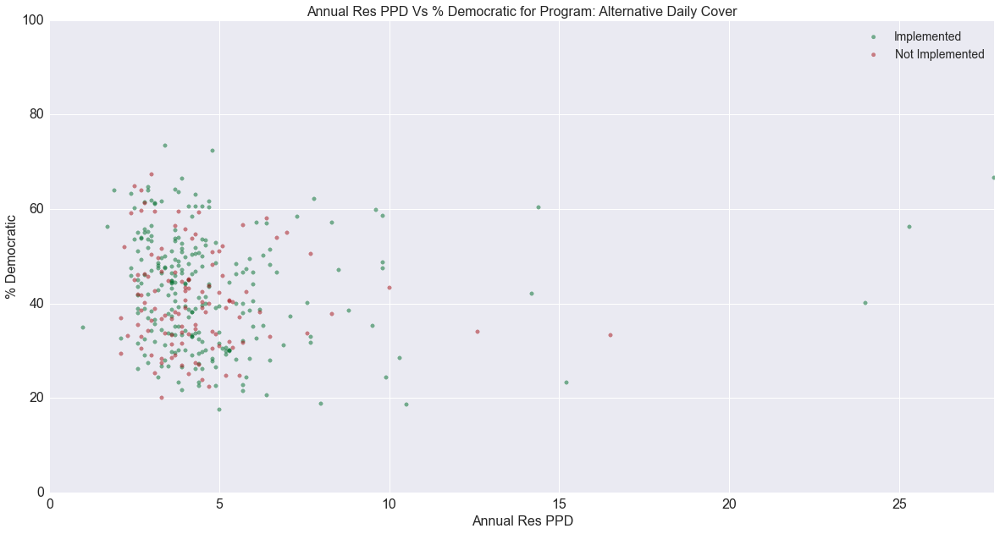

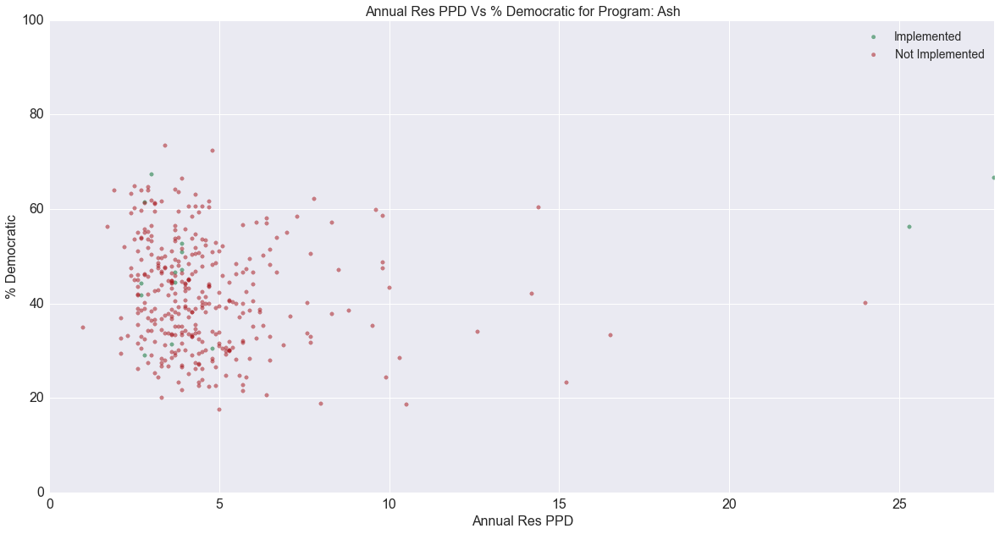

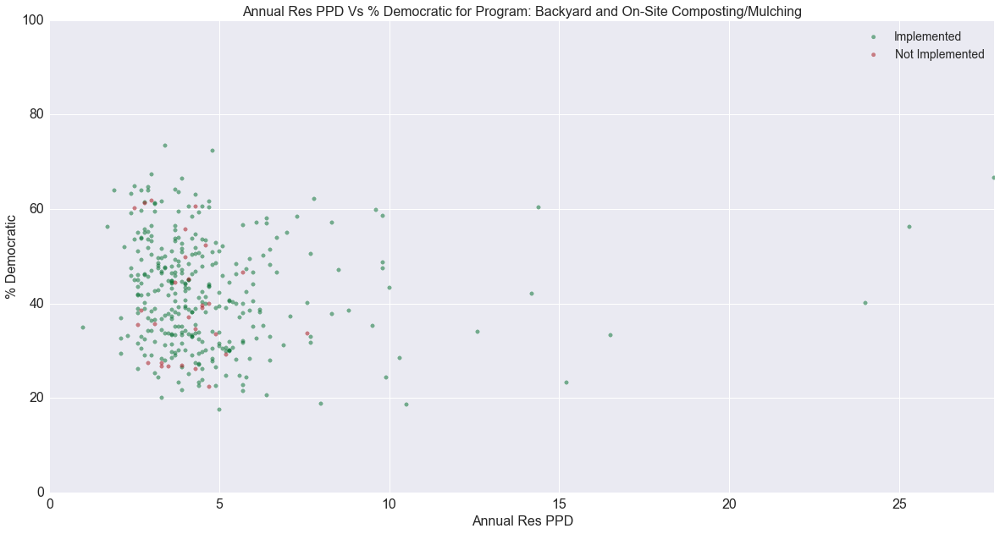

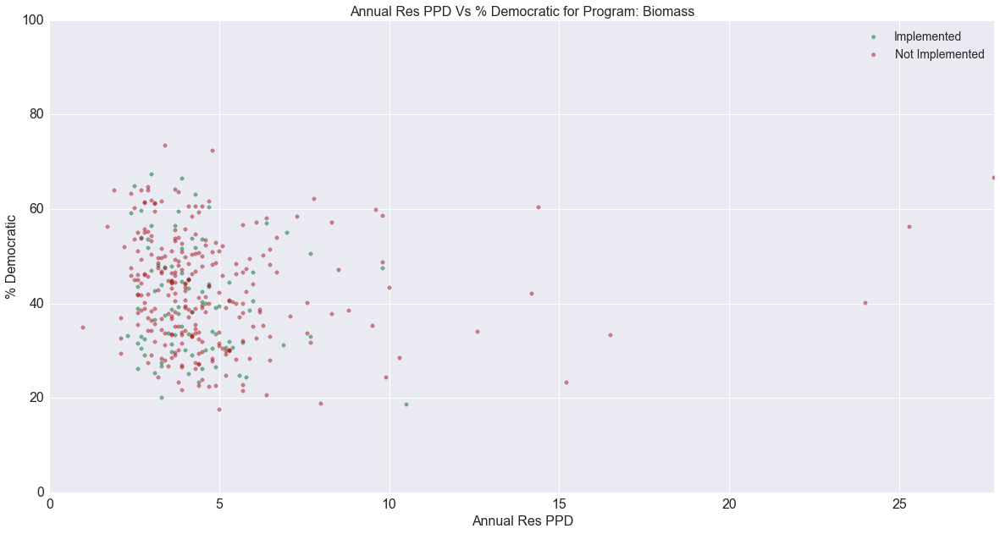

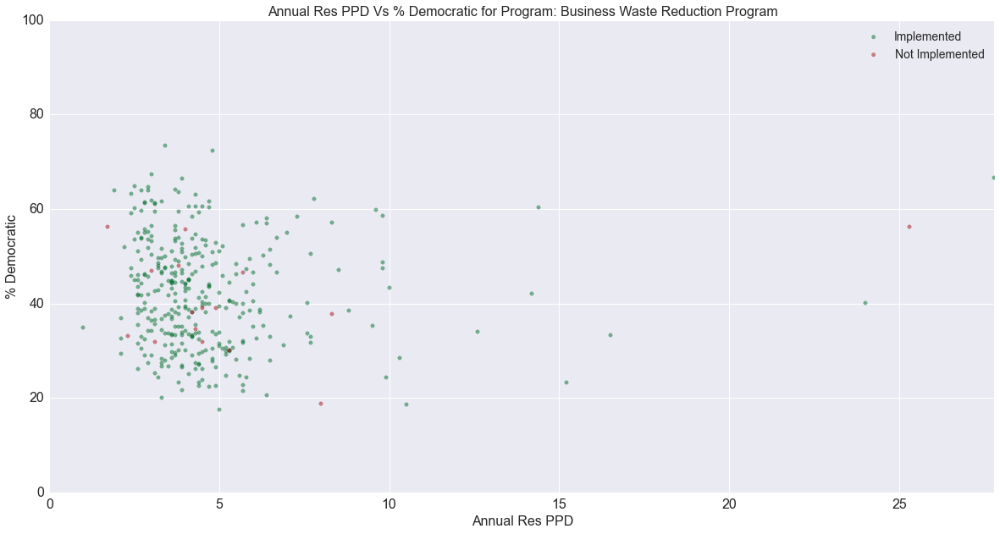

...

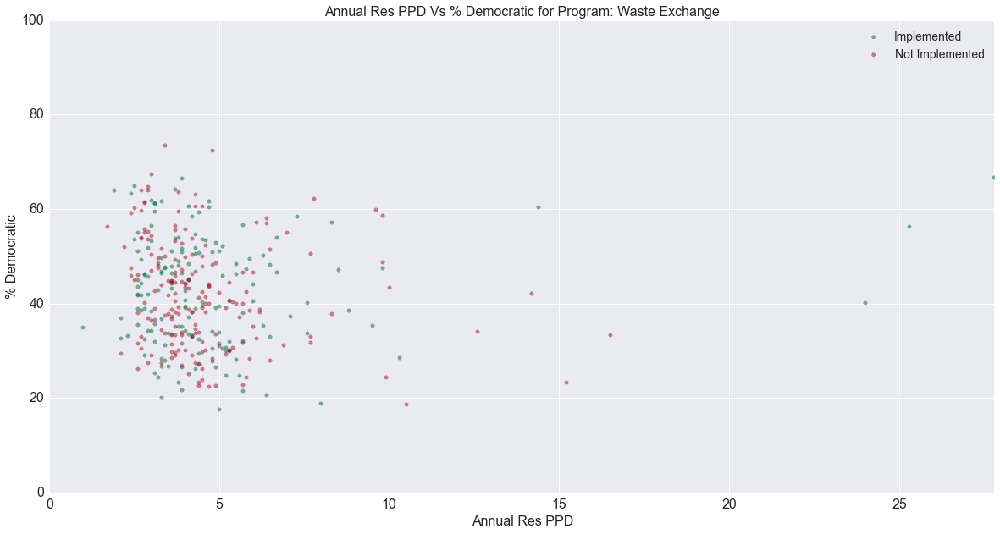

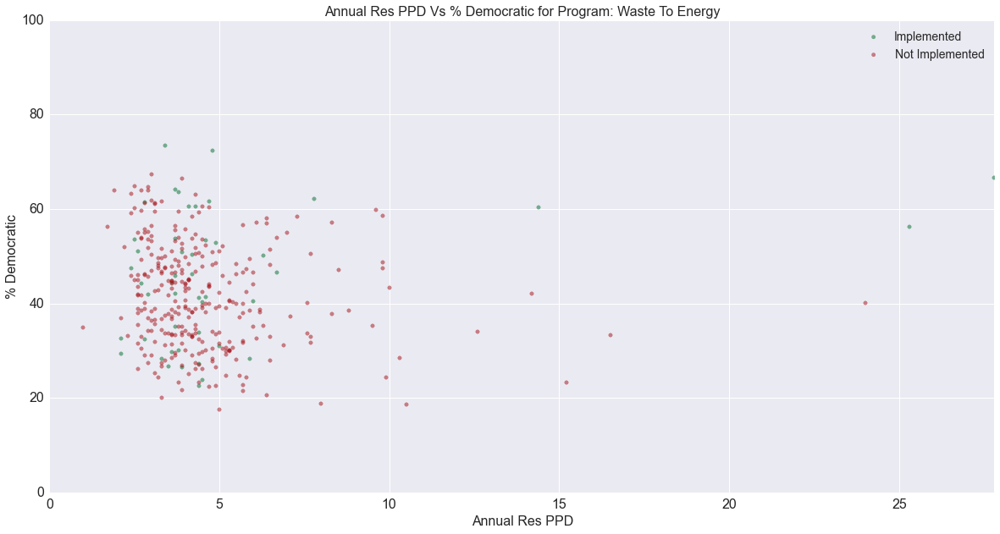

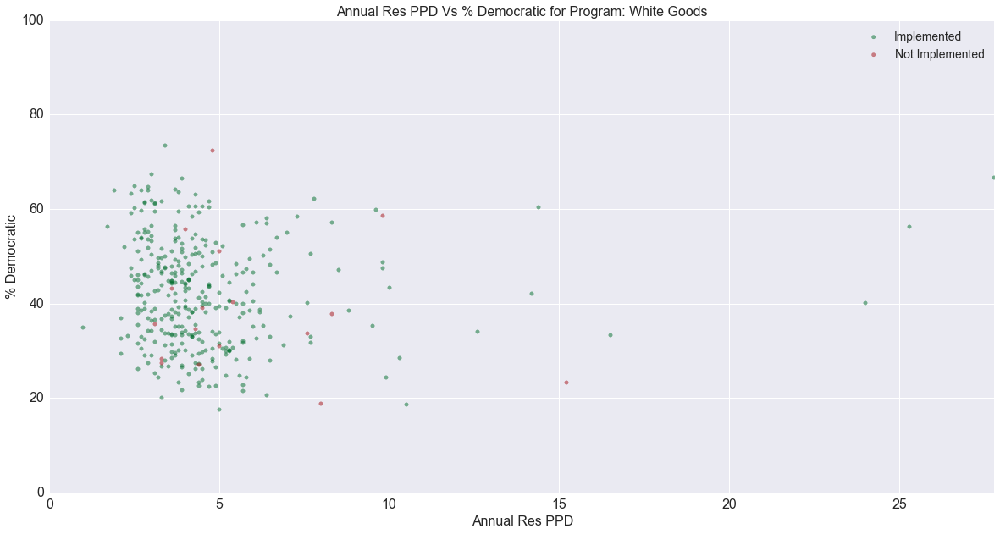

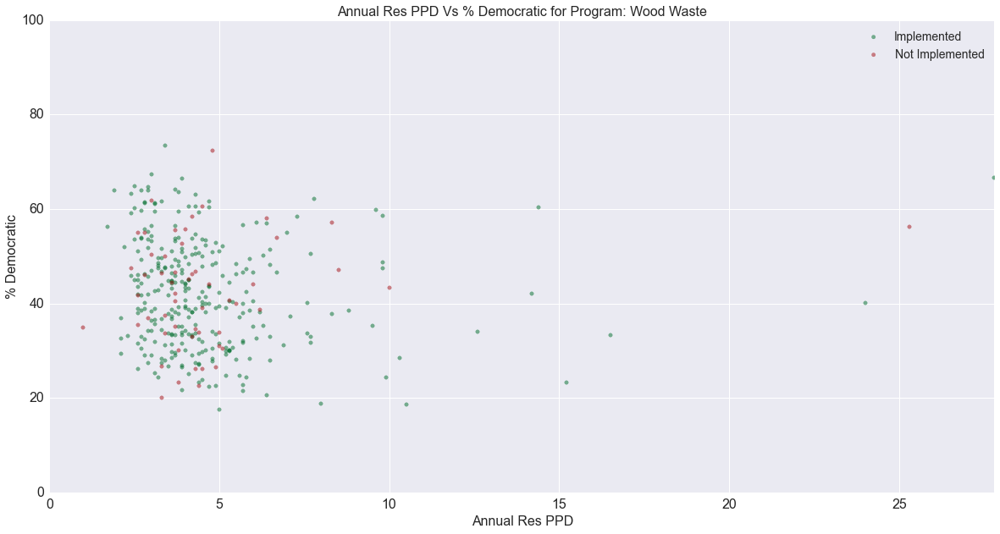

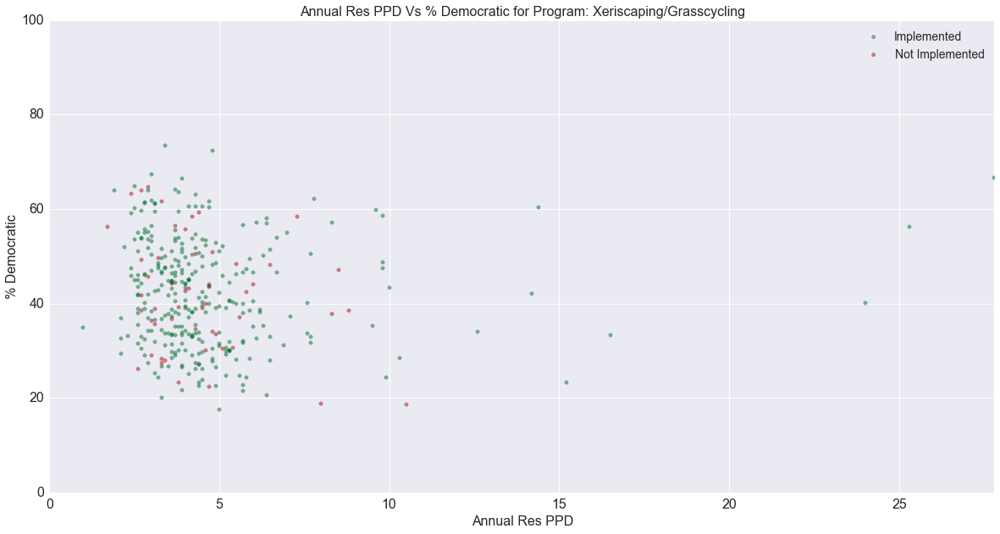

In [17]:
# Annual Resident PPD Vs % Democratic
ppd_vs_voter_program(data, 'Annual_ResPPD_', 'Democratic_')

In [18]:
def ppd_vs_popDensity_program(df, ppd):
    '''
    Function to plot PPD rate vs population density, given recycling program
    df: Dataframe
    ppd (String input): Annual_ResPPD_ or Annual_EmpPPD_
    '''
    key = pd.read_csv('program_key.csv')
    i = str(2013)
    prgm = list(np.arange(1, 63, 1))
    for p in prgm:
        temp = df[[ppd + i, 'Population', 'Area_SqMi', i + '_Prgm_' + str(p)]]
        # Remove PPD outlier
        temp = temp[temp[ppd + i] < 100]
        # Calculate Voter %
        temp['PopDensity'] = temp['Population'] * 100/temp['Area_SqMi']
        plt.figure(figsize=(20,10))
        # If Program = 1 - Green, else - Red
        cond = temp[i + '_Prgm_' + str(p)] == 1
        plt.scatter(temp[ppd + i][cond], temp['PopDensity'][cond], color = '#006d2c', alpha = 0.5, label = 'Implemented')
        plt.scatter(temp[ppd + i][~cond], temp['PopDensity'][~cond], color = '#a50f15', alpha = 0.5, label = 'Not Implemented')
        # Figure text
        text_0 = ppd[:-8] + ' ' + ppd[-7:-4] + ' ' + ppd[-4:-1]
        text_1 = ' Vs Population Density'
        text_2 = ' for Program:' + key[key['Key'] == 'Prgm_' + str(p)]['Program Name'][p-1]
        # Set axis labels
        plt.xlabel(text_0, fontsize = 16)
        plt.ylabel('Population Density', fontsize = 16)
        # Set axis limits
        plt.xlim(0, max(temp[ppd + i]))
        plt.ylim(0, max(temp['PopDensity']))
        # Set tick label size
        plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
        # Set figure title
        plt.title(text_0 + text_1 + text_2, fontsize = 16)
        # Set legend and legends fontsize
        plt.legend(prop={'size': 14})
        plt.show()

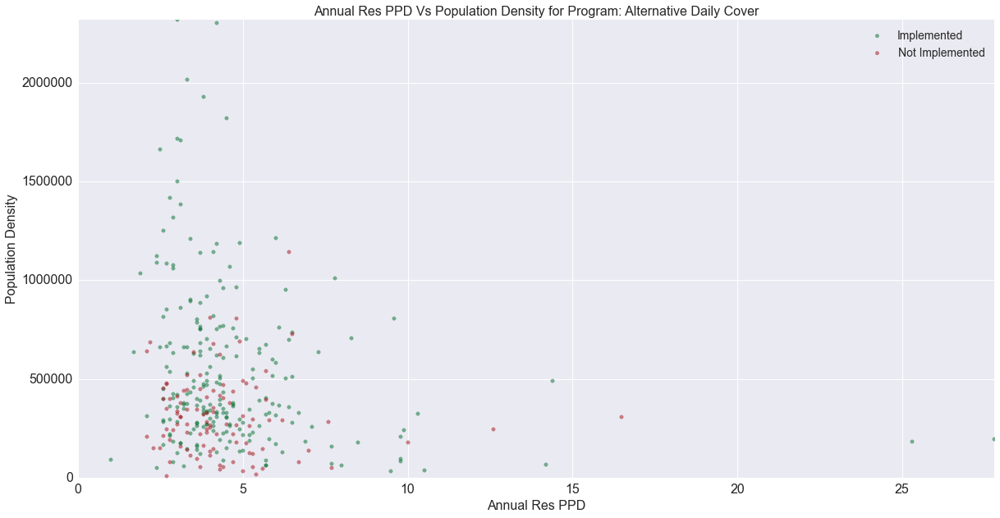

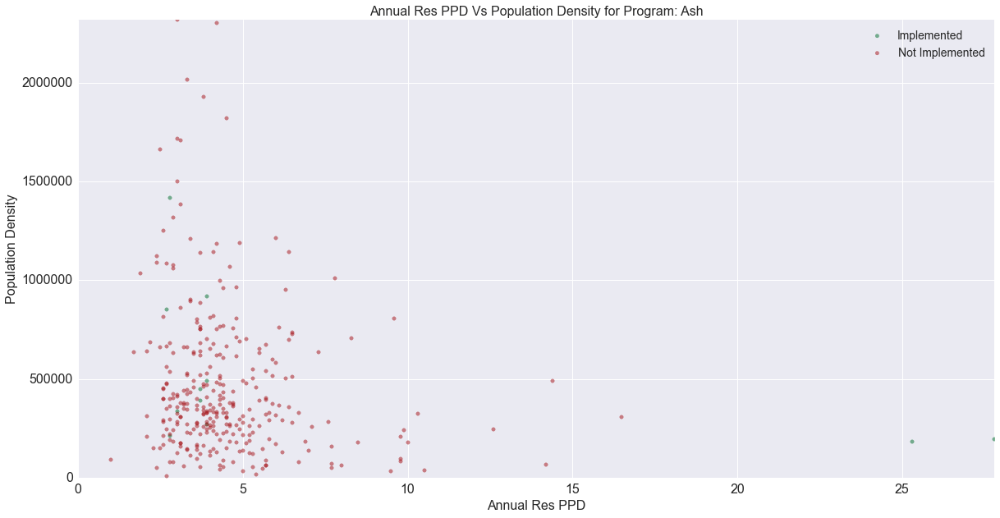

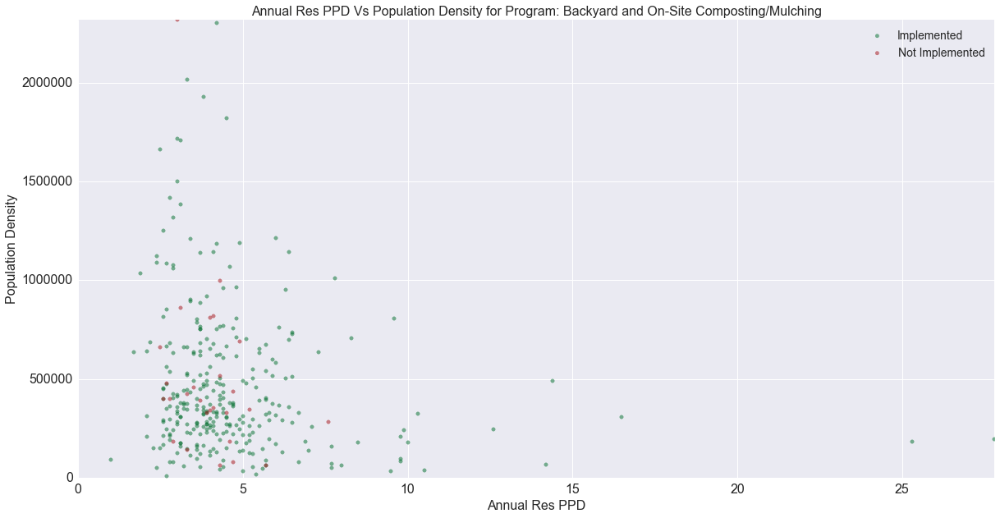

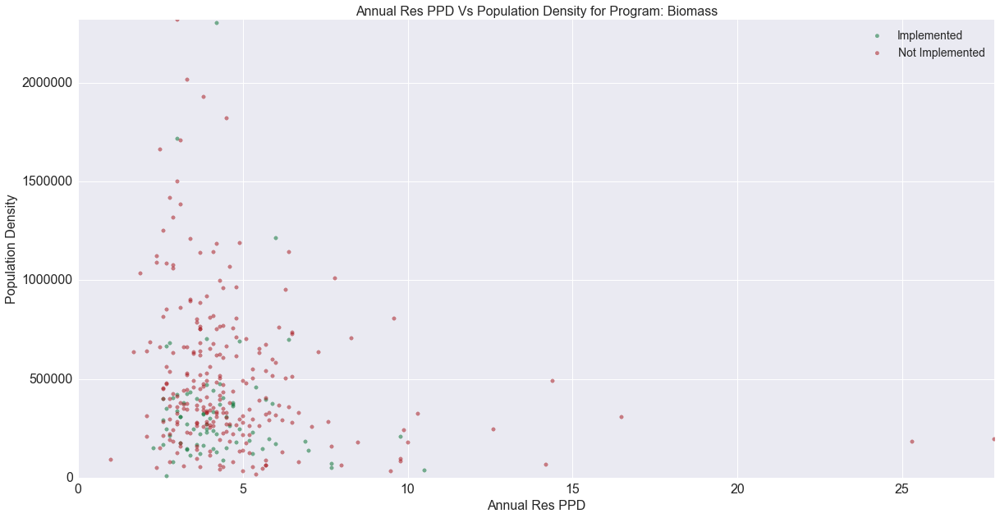

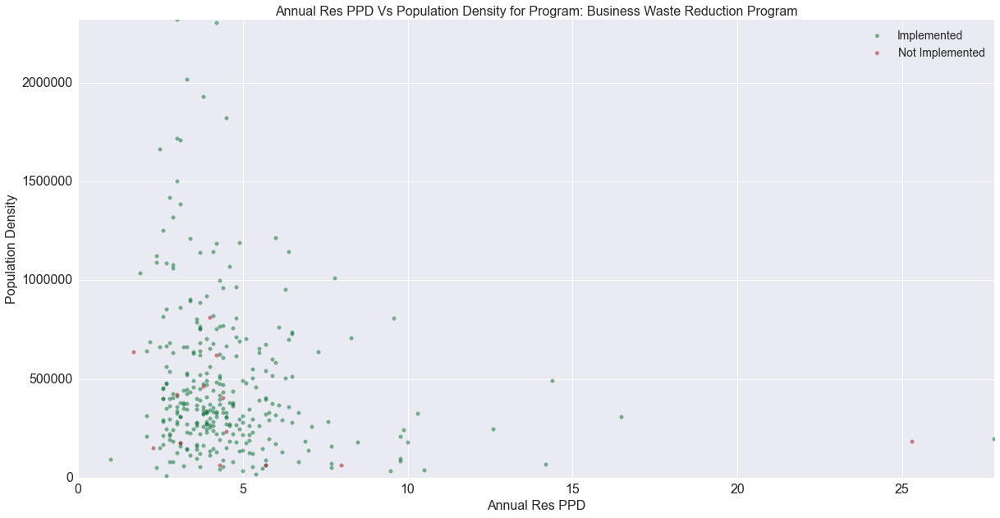

...

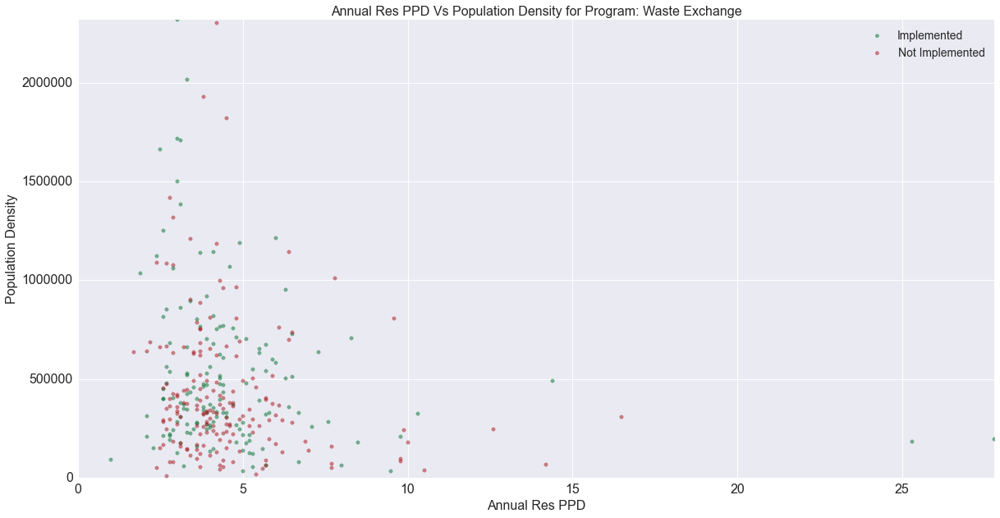

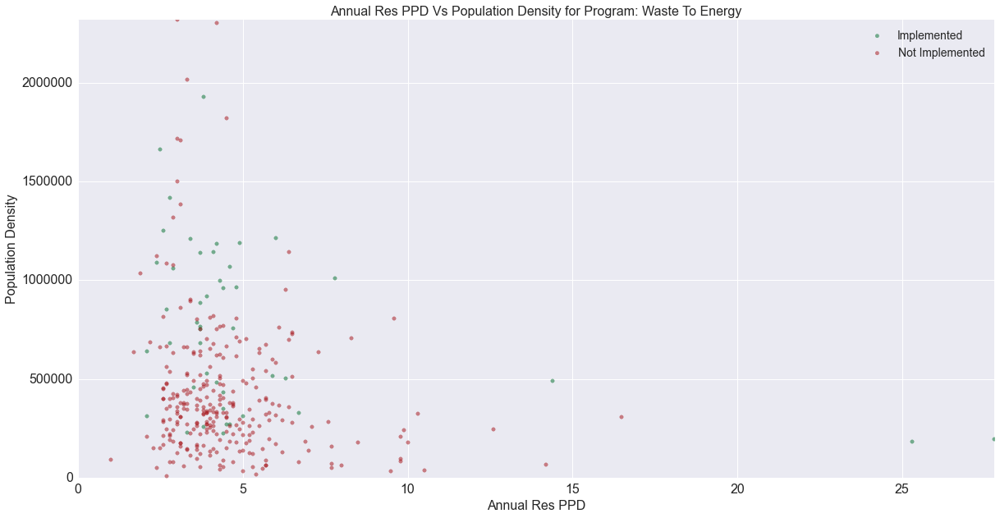

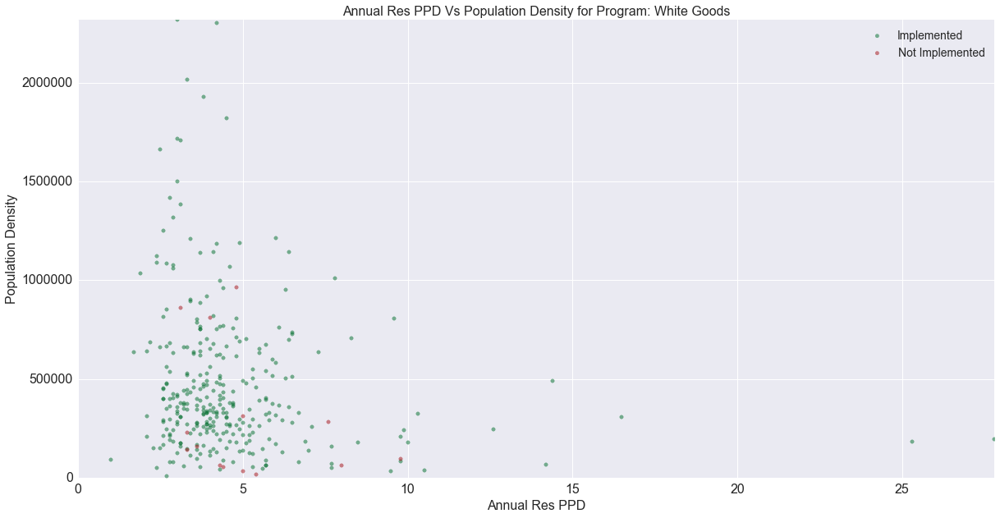

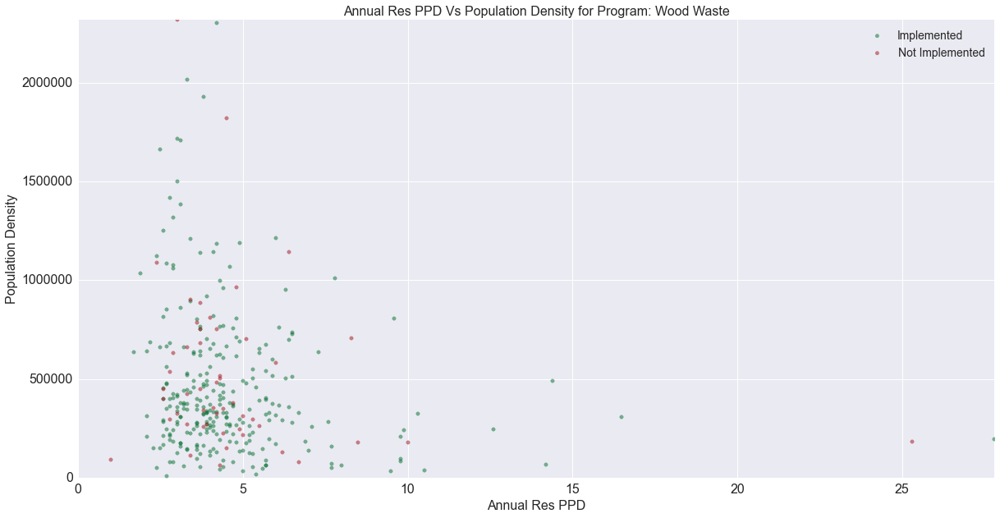

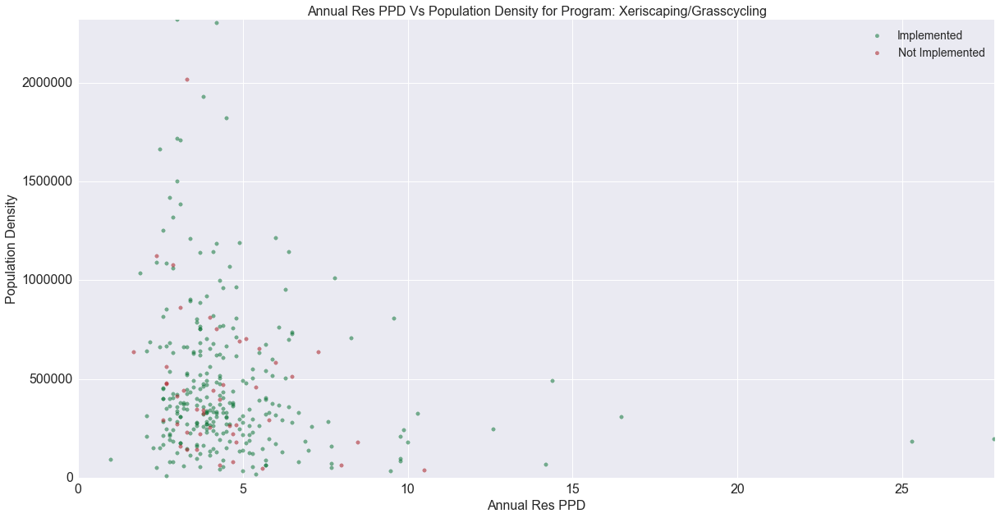

In [19]:
ppd_vs_popDensity_program(data, 'Annual_ResPPD_')

In [20]:
def annual_vs_target_program(df, annual, target):
    '''
    Function to plot annual ppd rate vs target ppd, given recycling program
    df: Dataframe
    annual (String input): Annual_ResPPD_ or Annual_EmpPPD_
    target (String input): Target_ResPPD_ or Target_EmpPPD_
    '''
    key = pd.read_csv('program_key.csv')
    i = str(2013)
    prgm = list(np.arange(1, 63, 1))
    for p in prgm:
        temp = df[[annual + i, target + i, i + '_Prgm_' + str(p)]]
        # Remove annual outlier
        temp = temp[temp[annual + i] < 100]
        plt.figure(figsize=(20,10))
        # If Program = 1 - Green, else - Red
        cond = temp[i + '_Prgm_' + str(p)] == 1
        plt.scatter(temp[annual + i][cond], temp[target + i][cond], color = '#006d2c', alpha = 0.5, label = 'Implemented')
        plt.scatter(temp[annual + i][~cond], temp[target + i][~cond], color = '#a50f15', alpha = 0.5, label = 'Not Implemented')
        # Figure text
        text_0 = annual[:-8] + ' ' + annual[-7:-4] + ' ' + annual[-4:-1]
        text_1 = ' Vs ' 
        text_2 = target[:-8] + ' ' + target[-7:-4] + ' ' + target[-4:-1]
        text_3 = ' for Program:' + key[key['Key'] == 'Prgm_' + str(p)]['Program Name'][p-1]
        # Set axis labels
        plt.xlabel(text_0, fontsize = 16)
        plt.ylabel(text_2, fontsize = 16)
        # Set axis limits
        plt.xlim(0, max(temp[annual + i]))
        plt.ylim(0, max(temp[target + i]))
        # Set tick label size
        plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
        # Set figure title
        plt.title(text_0 + text_1 + text_2 + text_3, fontsize = 16)
        # Set legend and legends fontsize
        plt.legend(prop={'size': 14})
        plt.show()

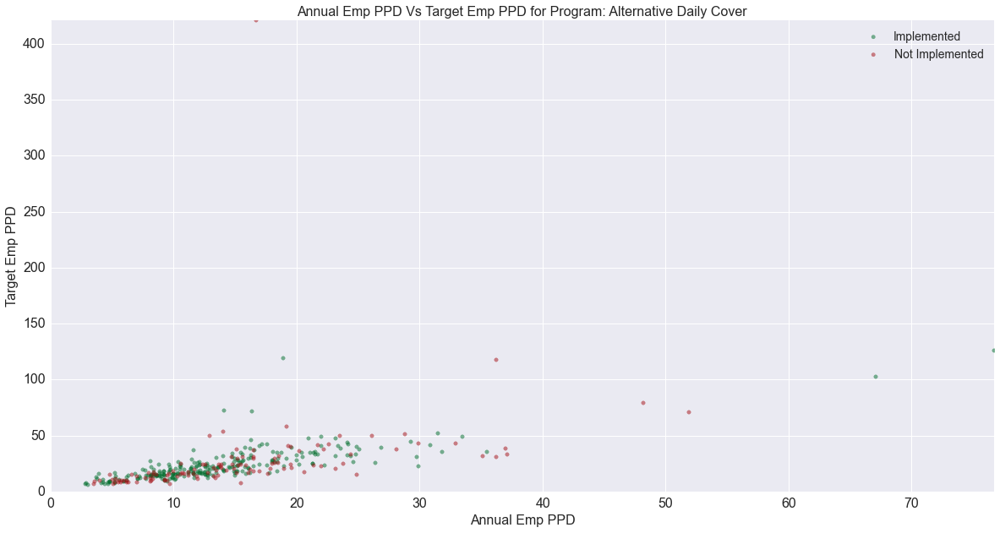

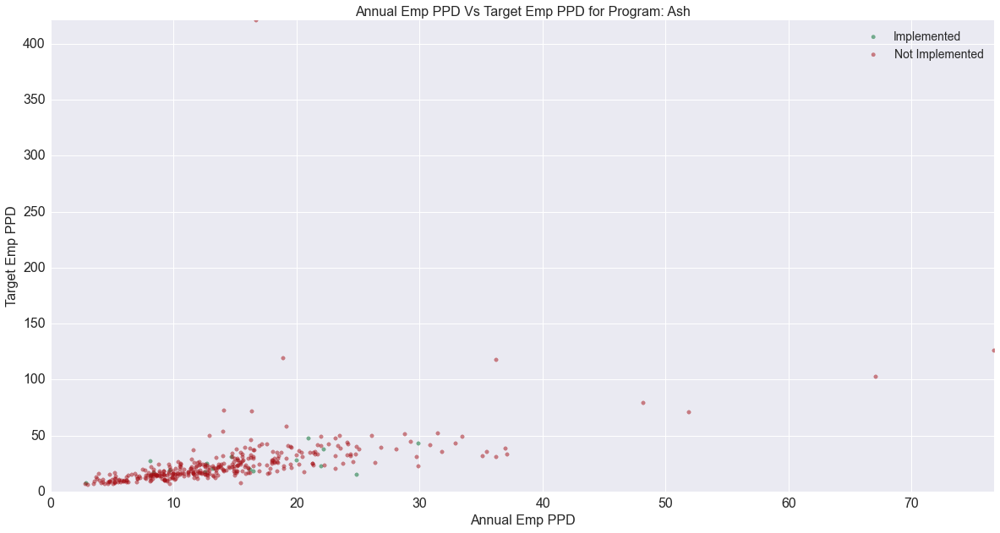

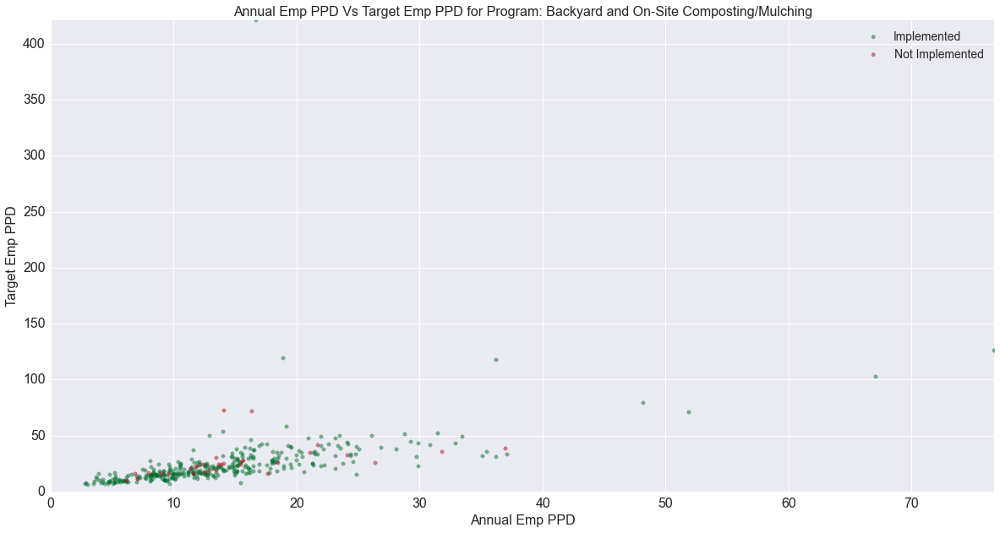

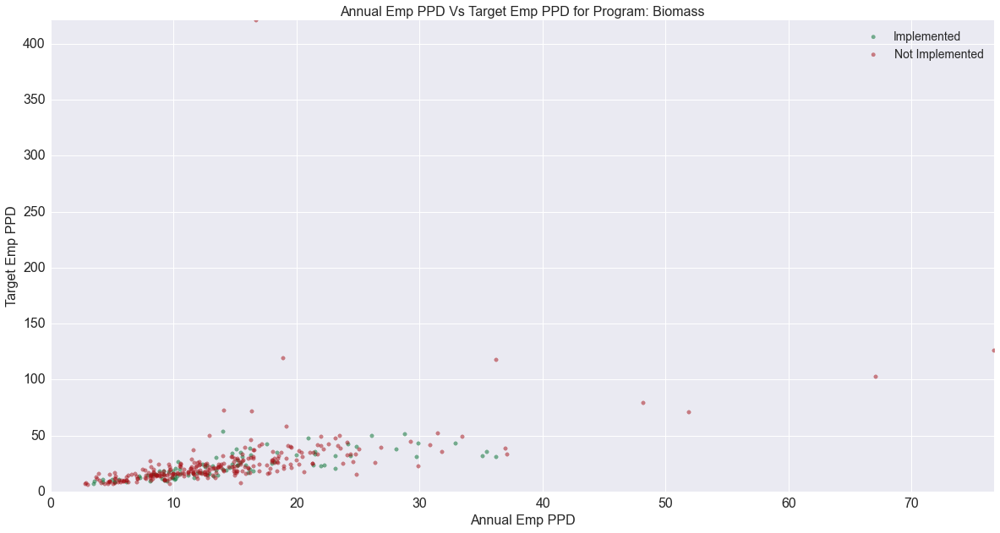

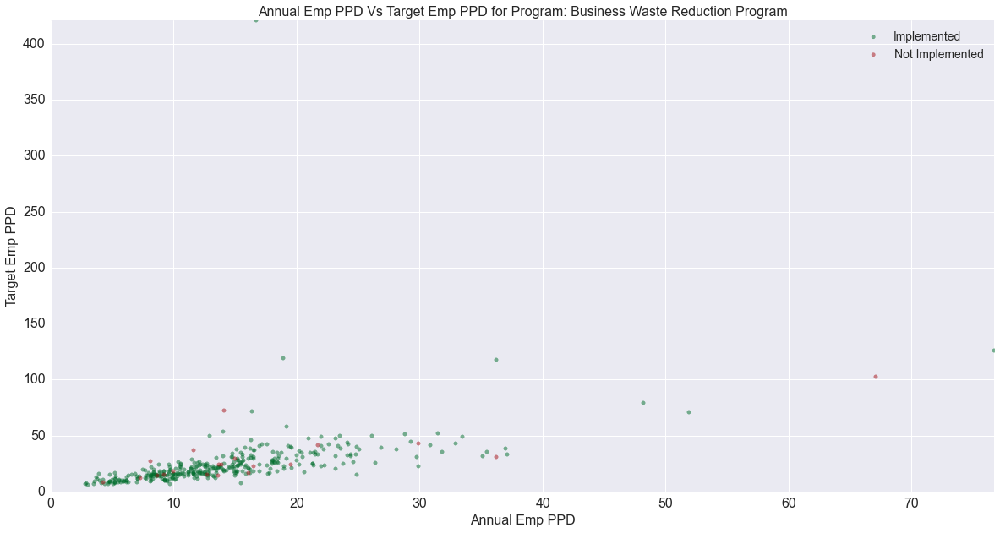

...

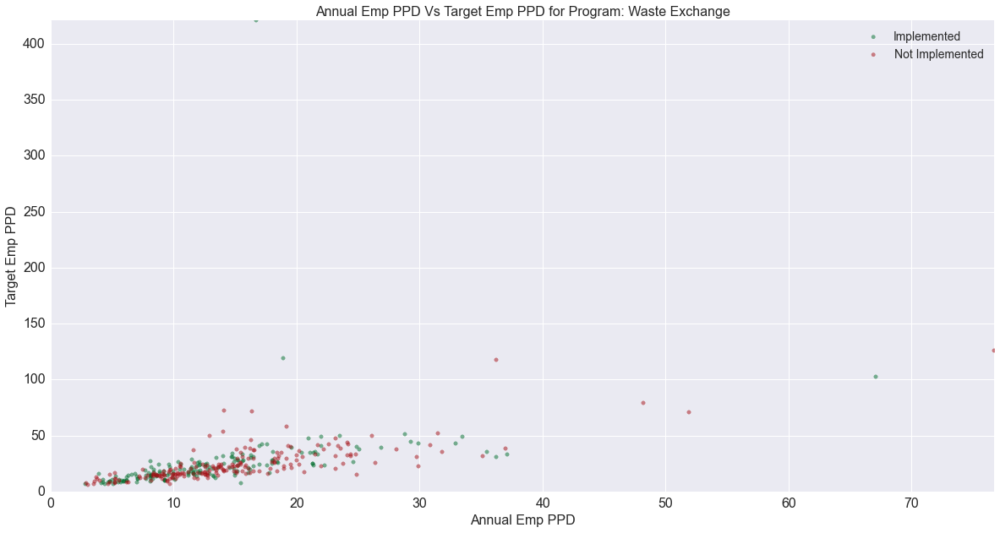

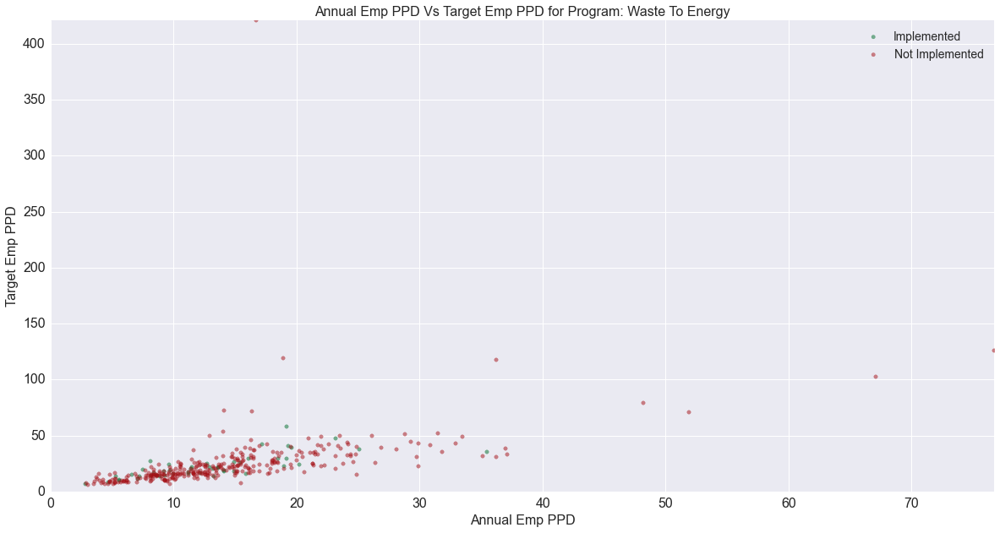

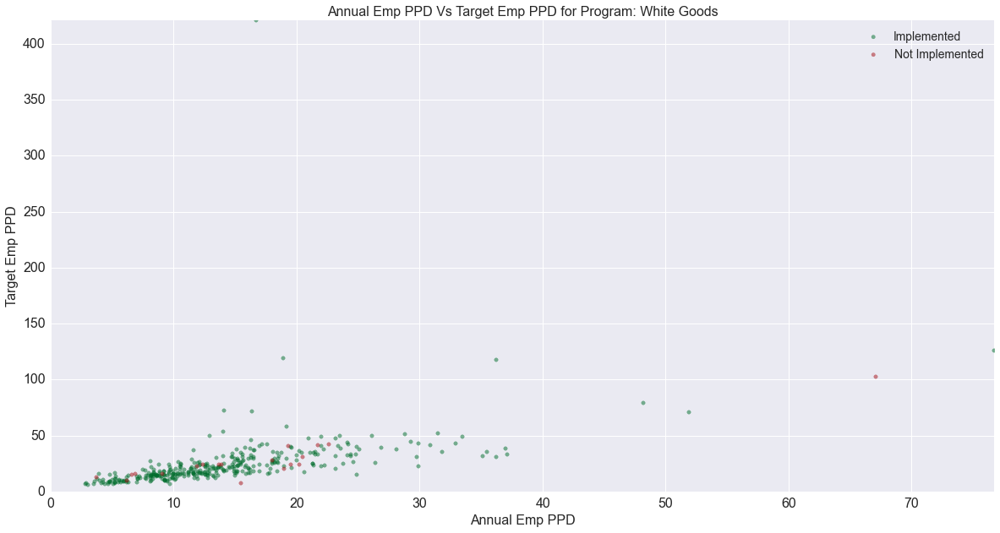

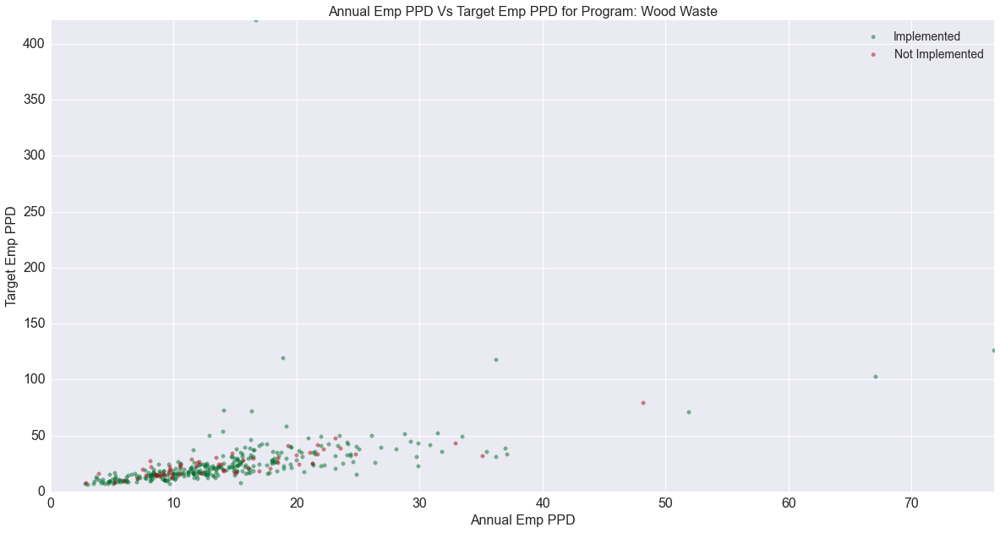

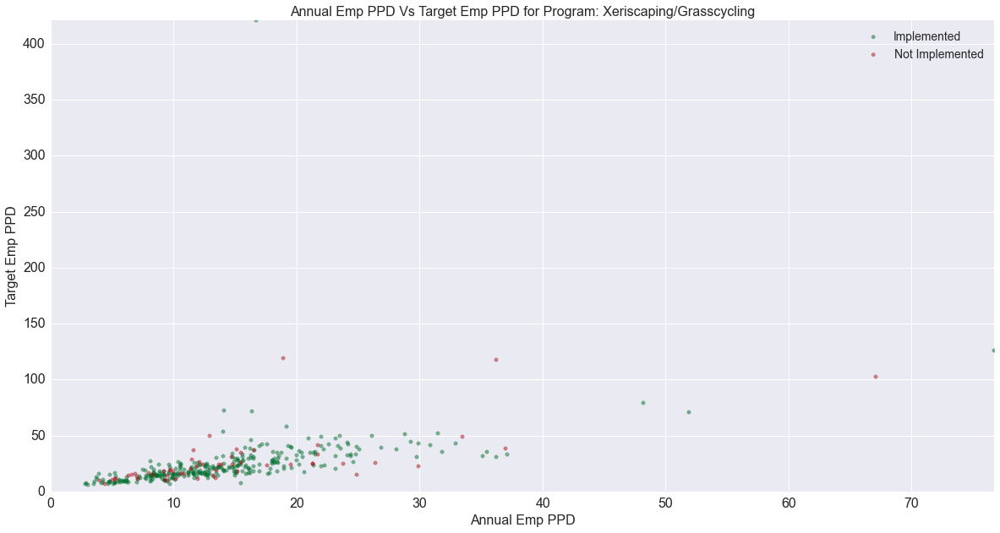

In [21]:
annual_vs_target_program(data, 'Annual_EmpPPD_', 'Target_EmpPPD_')

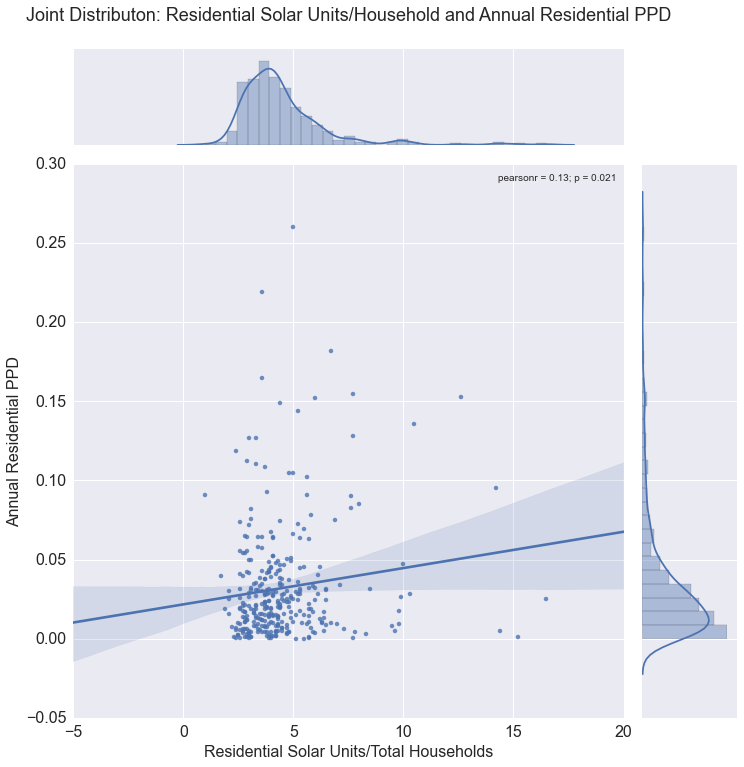

In [22]:
# Joint Distribution: Residential Solar Units/Household and Annual Residential PPD
temp = data[['Annual_ResPPD_2013', 'SolarUnits_Residential', 'TotalHH']]
temp['Solar/HH'] = temp['SolarUnits_Residential']/temp['TotalHH']
temp = temp[temp['Annual_ResPPD_2013'] < 20] # Dropped outliers

plt.figure(figsize = (10, 10))
sns.jointplot('Annual_ResPPD_2013', 'Solar/HH', data = temp, kind = 'reg', size = 10)
plt.xlabel('Residential Solar Units/Total Households', fontsize = 16)
plt.ylabel('Annual Residential PPD', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
# Set vertical position of title using argument y
text = 'Joint Distributon: Residential Solar Units/Household and Annual Residential PPD'
plt.title(text, fontsize = 18, y = 1.25, horizontalalignment='center')

# Note: If < 100 used, corr = 0.056, and if < 20 used corr = 0.13

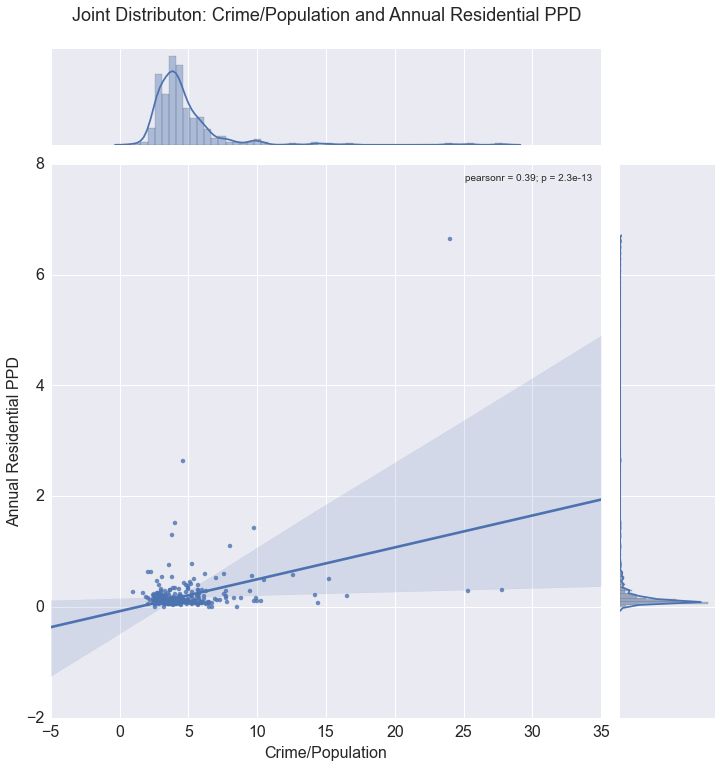

In [23]:
# Joint Distribution: Crime/Population and Annual Residential PPD
temp = data[['Annual_ResPPD_2013', 'TotCrimes_2013', 'Population']]
temp['Crime/Pop'] = temp['TotCrimes_2013']/temp['Population']
temp = temp[temp['Annual_ResPPD_2013'] < 100] # Dropped outliers

plt.figure(figsize = (10, 10))
sns.jointplot('Annual_ResPPD_2013', 'Crime/Pop', data = temp, kind = 'reg', size = 10)
plt.xlabel('Crime/Population', fontsize = 16)
plt.ylabel('Annual Residential PPD', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
# Set vertical position of title using argument y
text = 'Joint Distributon: Crime/Population and Annual Residential PPD'
plt.title(text, fontsize = 18, y = 1.25, horizontalalignment='center')

# Note: No outliers dropped, corr = 0.9, if < 100 used, corr = 0.39, and if < 20 used corr = 0.16

In [24]:
# Correlation between columns in a dataframe

temp = data[['Population', 'TotCrimes_2013', 'SolarUnits_Residential', 'Annual_ResPPD_2013', 'Annual_EmpPPD_2013', 'TotalHH', 'Area_SqMi']]
#temp = temp[temp['Annual_ResPPD_2013'] < 100] # Dropped outliers
temp['PopDensity'] = temp['Population']/temp['Area_SqMi']
temp['Solar/HH'] = temp['SolarUnits_Residential']/temp['TotalHH']
temp['Crime/Pop'] = temp['TotCrimes_2013']/temp['Population']
temp['HH/Area'] = temp['TotalHH']/temp['Area_SqMi']
temp['Crime/Area'] = temp['TotCrimes_2013']/temp['Area_SqMi']
temp.pop('TotalHH')
temp.pop('Population')
temp.pop('Area_SqMi')
temp.pop('TotCrimes_2013')
temp.pop('SolarUnits_Residential')

for col1, col2 in it.combinations(temp.columns, 2):
    corr = temp[col1].corr(temp[col2])
    if 'Annual_ResPPD' in col1 or 'Annual_EmpPPD' in col1 and abs(corr) > 0:
        print 'Correlation between "{}" and "{}" = {}'.format(col1, col2, corr)

Correlation between "Annual_ResPPD_2013" and "Annual_EmpPPD_2013" = -0.0254259549404
Correlation between "Annual_ResPPD_2013" and "PopDensity" = -0.127506889407
Correlation between "Annual_ResPPD_2013" and "Solar/HH" = -0.0173824241568
Correlation between "Annual_ResPPD_2013" and "Crime/Pop" = 0.89699859391
Correlation between "Annual_ResPPD_2013" and "HH/Area" = -0.136645631565
Correlation between "Annual_ResPPD_2013" and "Crime/Area" = -0.0456355248511
Correlation between "Annual_EmpPPD_2013" and "PopDensity" = -0.0877256722094
Correlation between "Annual_EmpPPD_2013" and "Solar/HH" = -0.00756865365302
Correlation between "Annual_EmpPPD_2013" and "Crime/Pop" = -0.0241562800725
Correlation between "Annual_EmpPPD_2013" and "HH/Area" = -0.103441984842
Correlation between "Annual_EmpPPD_2013" and "Crime/Area" = 0.016034285574


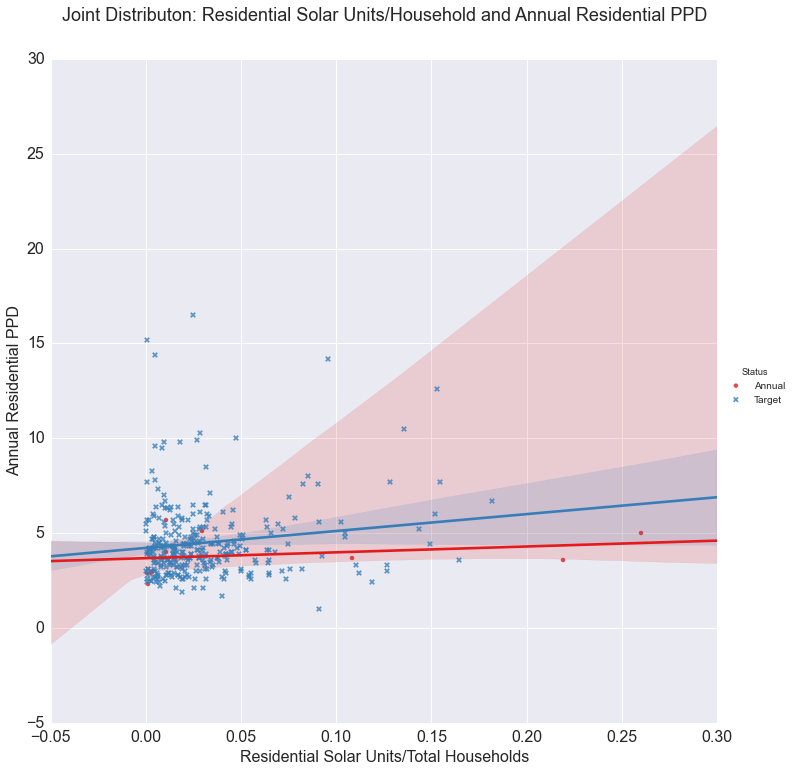

In [25]:
# Joint Distribution: Residential Solar Units/Household and Annual Residential PPD with Annual PPD > Target PPD
temp = data[['Annual_ResPPD_2013', 'SolarUnits_Residential', 'TotalHH', 'Target_ResPPD_2013']]
temp['Solar/HH'] = temp['SolarUnits_Residential']/temp['TotalHH']
temp = temp[temp['Annual_ResPPD_2013'] < 20] # Dropped outliers

### Create new colum based on condition
# 1. Create a function to test condition and return a value
def status(col):
    if col['Annual_ResPPD_2013'] > col['Target_ResPPD_2013']:
        return 'Annual'
    else:
        return 'Target'

# 2. Apply function: df.apply(function, axis = 1). Note: axis = 1 is along the columns ---->  
temp['Status'] = temp.apply(status, axis = 1)

# lmplot: size argument controls the size of the plot
sns.lmplot(x = 'Solar/HH', y = 'Annual_ResPPD_2013', hue = 'Status', data = temp, size = 10, markers=["o", "x"], palette = 'Set1')
plt.xlabel('Residential Solar Units/Total Households', fontsize = 16)
plt.ylabel('Annual Residential PPD', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
# Set vertical position of title using argument y
text = 'Joint Distributon: Residential Solar Units/Household and Annual Residential PPD'
plt.title(text, fontsize = 18, y = 1.05, horizontalalignment='center')
#plt.legend(prop={'size': 14}) 

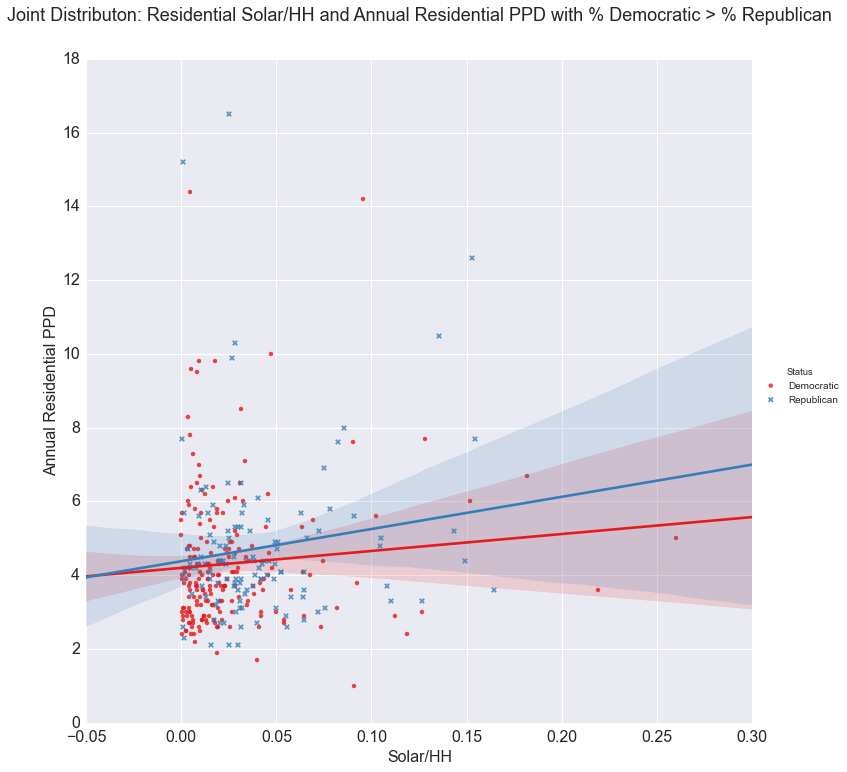

In [26]:
# Joint Distribution: % Residential Solar Units/HH and Annual Residential PPD with % Democratic > % Republican
temp = data[['Annual_ResPPD_2013', 'Tot_Registered_2013', 'Democratic_2013', 'Republican_2013', 'SolarUnits_Residential', 'TotalHH']]
temp['Democratic'] = temp['Democratic_2013'] * 100/temp['Tot_Registered_2013']
temp['Republican'] = temp['Republican_2013'] * 100/temp['Tot_Registered_2013']
temp['Solar/HH'] = temp['SolarUnits_Residential']/temp['TotalHH']
temp = temp[temp['Annual_ResPPD_2013'] < 20] # Dropped outliers

### Create new colum based on condition
# 1. Create a function to test condition and return a value
def status(col):
    if col['Democratic'] > col['Republican']:
        return 'Democratic'
    else:
        return 'Republican'

# 2. Apply function: df.apply(function, axis = 1). Note: axis = 1 is along the columns ---->  
temp['Status'] = temp.apply(status, axis = 1)

# lmplot: size argument controls the size of the plot
sns.lmplot(x = 'Solar/HH', y = 'Annual_ResPPD_2013', hue = 'Status', data = temp, size = 10, markers=["o", "x"], palette = 'Set1')
plt.xlabel('Solar/HH', fontsize = 16)
plt.ylabel('Annual Residential PPD', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
# Set vertical position of title using argument y
text = 'Joint Distributon: Residential Solar/HH and Annual Residential PPD with % Democratic > % Republican'
plt.title(text, fontsize = 18, y = 1.05, horizontalalignment='center')
#plt.legend(prop={'size': 14})

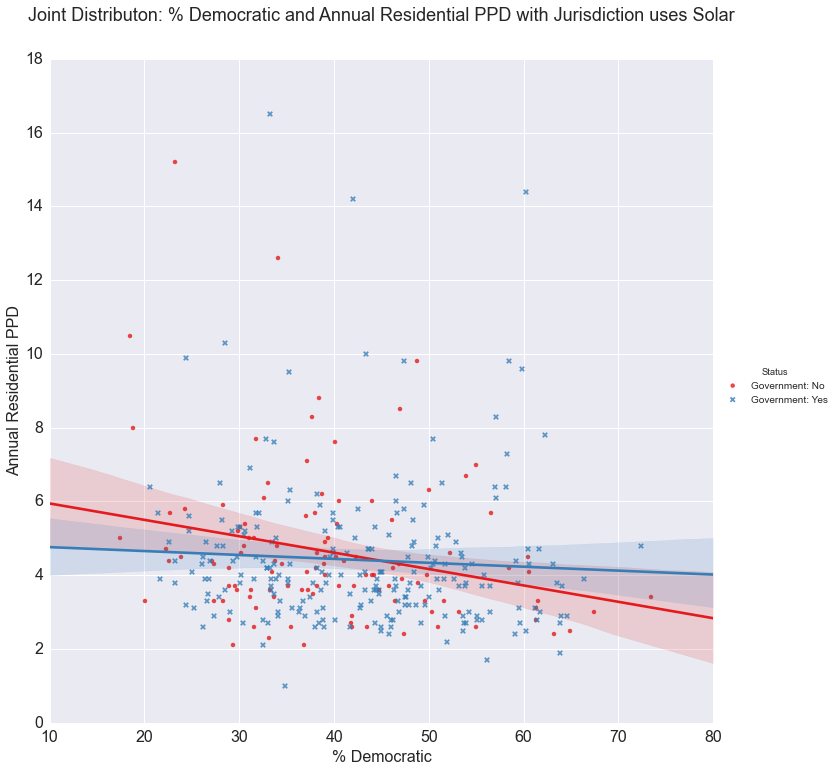

In [27]:
# Joint Distribution: Government Solar Unit/Population and Annual Residential PPD with % Democratic > % Republican
temp = data[['Annual_ResPPD_2013', 'Tot_Registered_2013', 'Democratic_2013', 'Republican_2013', 'SolarUnits_Government', 'Population']]
temp['Democratic'] = temp['Democratic_2013'] * 100/temp['Tot_Registered_2013']
temp['Republican'] = temp['Republican_2013'] * 100/temp['Tot_Registered_2013']
temp['Solar/Pop'] = temp['SolarUnits_Government']/temp['Population']
temp = temp[temp['Annual_ResPPD_2013'] < 20] # Dropped outliers

### Create new colum based on condition
# 1. Create a function to test condition and return a value
def status(col):
    if col['Solar/Pop'] > 0:
        return 'Government: Yes'
    else:
        return 'Government: No'

# 2. Apply function: df.apply(function, axis = 1). Note: axis = 1 is along the columns ---->  
temp['Status'] = temp.apply(status, axis = 1)

# lmplot: size argument controls the size of the plot
sns.lmplot(x = 'Democratic', y = 'Annual_ResPPD_2013', hue = 'Status', data = temp, size = 10, markers=["o", "x"], palette = 'Set1')
plt.xlabel('% Democratic', fontsize = 16)
plt.ylabel('Annual Residential PPD', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
# Set vertical position of title using argument y
text = 'Joint Distributon: % Democratic and Annual Residential PPD with Jurisdiction uses Solar'
plt.title(text, fontsize = 18, y = 1.05, horizontalalignment='center')
#plt.legend(prop={'size': 14})

# Check pearson r and p value

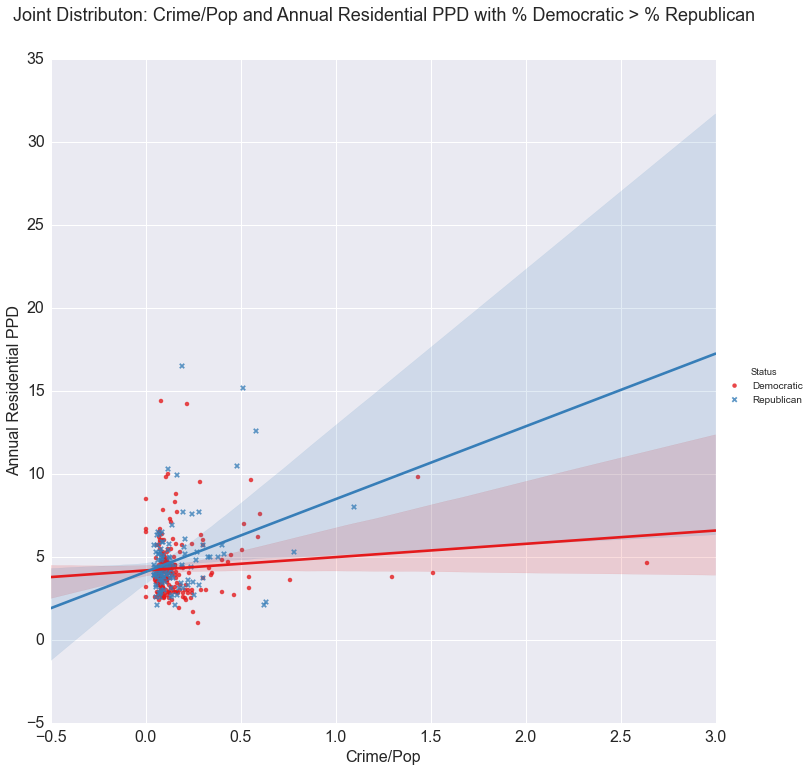

In [28]:
# Joint Distribution: % Residential Solar Units/HH and Annual Residential PPD with % Democratic > % Republican
temp = data[['Annual_ResPPD_2013', 'Tot_Registered_2013', 'Democratic_2013', 'Republican_2013', 'TotCrimes_2013', 'Population']]
temp['Tot'] = temp['Democratic_2013'] + temp['Republican_2013']
#temp['Democratic'] = temp['Democratic_2013'] * 100/temp['Tot_Registered_2013']
#temp['Republican'] = temp['Republican_2013'] * 100/temp['Tot_Registered_2013']
temp['Democratic'] = temp['Democratic_2013'] * 100/temp['Tot']
temp['Republican'] = temp['Republican_2013'] * 100/temp['Tot']
temp['Crime/Pop'] = temp['TotCrimes_2013']/temp['Population']
temp = temp[temp['Annual_ResPPD_2013'] < 20] # Dropped outliers

### Create new colum based on condition
# 1. Create a function to test condition and return a value
def status(col):
    if col['Democratic'] > col['Republican']:
        return 'Democratic'
    else:
        return 'Republican'

# 2. Apply function: df.apply(function, axis = 1). Note: axis = 1 is along the columns ---->  
temp['Status'] = temp.apply(status, axis = 1)

# lmplot: size argument controls the size of the plot
sns.lmplot(x = 'Crime/Pop', y = 'Annual_ResPPD_2013', hue = 'Status', data = temp, size = 10, markers=["o", "x"], palette = 'Set1')
plt.xlabel('Crime/Pop', fontsize = 16)
plt.ylabel('Annual Residential PPD', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
# Set vertical position of title using argument y
text = 'Joint Distributon: Crime/Pop and Annual Residential PPD with % Democratic > % Republican'
plt.title(text, fontsize = 18, y = 1.05, horizontalalignment='center')
#plt.legend(prop={'size': 14})
# Log transform

## Notes

- Log transform data for long tailed distribution
- Check T-test for Programs
- Chi Squared for proportionality for categorical data
- Grid search cross validation, outlier is leverage point
- Check other than pearson r

## Transformations
**Reciprocal**  
The reciprocal, x to 1/x, with its sibling the negative reciprocal, x to -1/x, is a very strong transformation with a drastic effect on distribution shape. It can not be applied to zero values.  Although it can be applied to negative values, it is not useful unless all values are positive. The reciprocal of a ratio may often be interpreted as easily as the ratio itself: e.g.
    - population density (people per unit area) becomes area per person;
    - persons per doctor becomes doctors per person;
    - rates of erosion become time to erode a unit depth.
(In practice, we might want to multiply or divide the results of taking the reciprocal by some constant, such as 1000 or 10000, to get numbers that are easy to manage, but that itself has no effect on skewness or linearity.) The reciprocal reverses order among values of the same sign: largest becomes smallest, etc. The negative reciprocal preserves order among values of the same sign.

[Transformations](http://fmwww.bc.edu/repec/bocode/t/transint.html)

In [29]:
# Res PPD Difference = Target - Annual
data['ResPPD_Diff'] = data['Target_ResPPD_2013'] - data['Annual_ResPPD_2013']
data['EmpPPD_Diff'] = data['Target_EmpPPD_2013'] - data['Annual_EmpPPD_2013']

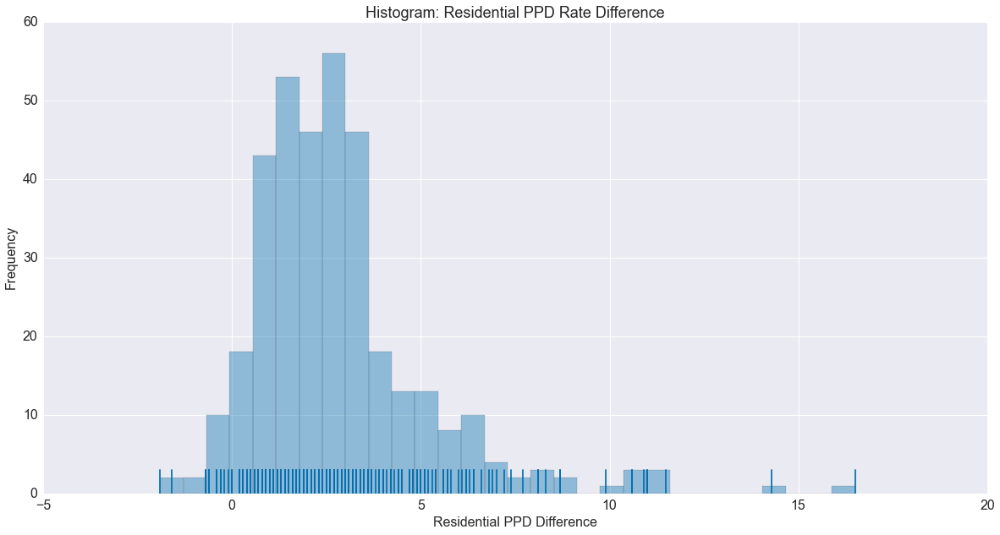

In [30]:
# Histogram: Residential PPD Rate Diff
temp_res = data[data['ResPPD_Diff'] < 20] # Dropped outliers

plt.figure(figsize = (20, 10))
sns.distplot(temp_res['ResPPD_Diff'].dropna(), kde = False, rug = True, color = '#0570b0')
plt.xlabel('Residential PPD Difference', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Residential PPD Rate Difference', fontsize = 18)

In [31]:
 # Bin Res PPD Difference
bins = [1, 3, 5, 7, 9]
data['ResPPD_Bin'] = 0 # Create a column to populate (initially filled with 0)

for i in range(data.shape[0]):
    for j in bins:
        if data.ix[i, 'ResPPD_Diff'] >= j:
            data.ix[i, 'ResPPD_Bin'] = j
            
group = data.groupby(['ResPPD_Bin'])[['Target_ResPPD_2013', 'Annual_ResPPD_2013', 'ResPPD_Diff']].count()
group.reset_index()

,ResPPD_Bin,Target_ResPPD_2013,Annual_ResPPD_2013,ResPPD_Diff
0,0,56,56,56
1,1,170,170,170
2,3,83,83,83
3,5,32,32,32
4,7,8,8,8
5,9,17,17,17


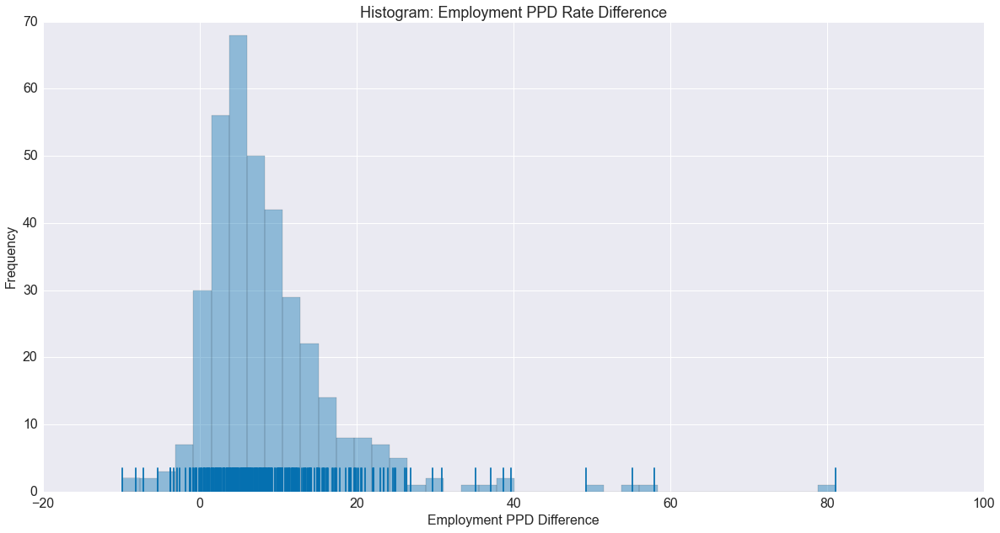

In [32]:
# Histogram: Employment PPD Rate Diff
temp_res = data[data['EmpPPD_Diff'] <= 100] # Dropped outliers

plt.figure(figsize = (20, 10))
sns.distplot(temp_res['EmpPPD_Diff'].dropna(), kde = False, rug = True, color = '#0570b0')
plt.xlabel('Employment PPD Difference', fontsize = 16)
plt.ylabel('Frequency', fontsize = 16)
plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
plt.title('Histogram: Employment PPD Rate Difference', fontsize = 18)

In [33]:
# Correlation calculations
def corr_calculation(df, pairs, corr_method, value):
    '''
    Function to calculation correlation.
    Input
    df: dataframe, pairs: tuple, corr_method: 'pearson' or 'kendall', value: float between 0 and 1 to filter corr values
    '''
    count = 0
    for (r, f) in pairs:
        try:
            corr = df[r].corr(df[f], method = corr_method)
            if not '_Prgm_' in f and abs(corr) > value:
                print 'Correlation between "{}" and "{}" = {}'.format(r, f, corr)
                print '-----------------------------------------------------------------------------------------------'
        except TypeError as e:
            count += 1
            print '**********************************************************************************************'
            print 'Error count: "{}". "{}" and "{}" giving error: "{}"'.format(count, r, f, e)
            print '**********************************************************************************************'

In [34]:
# Response variables, i.e. y
response = ['Annual_ResPPD_2013', 'Annual_EmpPPD_2013']

# Predictor variables or Features, i.e. x's
features = data.columns.tolist()#[7:]

# Response-Predictor pairs
pairs = [(r, f) for r in response for f in features]

# Remove outliers
#temp = data[data['ResPPD_Diff'] < 20] # Dropped outliers

# Fill NaN with Median
temp = data
temp.fillna(temp.median(), inplace = True)

corr_calculation(temp, pairs, 'pearson', 0.2)

**********************************************************************************************
Error count: "1". "Annual_ResPPD_2013" and "County" giving error: "unsupported operand type(s) for /: 'str' and 'int'"
**********************************************************************************************
**********************************************************************************************
Error count: "2". "Annual_ResPPD_2013" and "Jurisdiction" giving error: "unsupported operand type(s) for /: 'str' and 'int'"
**********************************************************************************************
Correlation between "Annual_ResPPD_2013" and "Target_ResPPD_2013" = 0.986763591082
-----------------------------------------------------------------------------------------------
Correlation between "Annual_ResPPD_2013" and "Annual_ResPPD_2013" = 1.0
-----------------------------------------------------------------------------------------------
*****************************

In [35]:
# Find Columns that are giving error
error_cols = []
count = 0
for (r, f) in pairs:
    try:
        corr = data[r].corr(data[f])
    except TypeError as e:
        count += 1
        error_cols.append(f)
        
print 'Number of columns with error: {}'.format(len(set(error_cols)))
set(error_cols)

Number of columns with error: 29


{'County',
 'Estimate; COMMUTING TO WORK - Mean travel time to work (minutes)',
 'Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Mean family income (dollars)',
 'Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Families - Median family income (dollars)',
 'Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for female full-time, year-round workers (dollars)',
 'Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Median earnings for male full-time, year-round workers (dollars)',
 'Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Mean nonfamily income (dollars)',
 'Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - Nonfamily households - Median nonfamily income (dollars)',
 'Estimate; INCOME AND BENEFITS (IN 2013 INFLATION-ADJUSTED DOLLARS) - With Supplemental Security Income - Mean Supplemental Security Income (dollars)',
 'E